In [2]:
from pathlib import Path
from modules.decomposeSTN import decomposeSTN as STN

import config
import librosa
import json

import numpy as np
import pandas as pd
import soundfile as sf
import matplotlib.pyplot as plt
from scipy.ndimage import zoom

plt.rcParams.update({'font.size': 18, 'axes.titlesize': 22, 'axes.labelsize': 20, 'xtick.labelsize': 16, 'ytick.labelsize': 16, 'legend.fontsize': 16})

/Users/mariapolak/miniconda3/envs/smc10/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/Users/mariapolak/miniconda3/envs/smc10/lib/python3.11/site-packages/torch/nn/utils/weight_norm.py:143: FutureWarning: `torch.nn.utils.weight_norm` is deprecated in favor of `torch.nn.utils.parametrizations.weight_norm`.
  WeightNorm.apply(module, name, dim)


In [3]:

colormap = plt.get_cmap('Set1')

def plot_fuzzy_energy(input: np.array, outputs: np.ndarray, outputs_names: list[str], sr: int, output_plot_path: str = None):
    def get_fuzzy_energy(x: np.array, sr: int):
        X = librosa.stft(x)
        Xn = np.abs(X)
        Y = np.sum(Xn**2, axis=0)
        Y_db = librosa.power_to_db(Y, ref=np.max)
        return Y_db

    nWin1 = 8192 # samples
    nWin2 = 512 # samples

    [xs, xt, xn] = STN.decSTN(input, sr, nWin1, nWin2)

    Xs = get_fuzzy_energy(xs, sr)
    Xt = get_fuzzy_energy(xt, sr)
    Xn = get_fuzzy_energy(xn, sr)

    fuzzy_energy = {
        "sines":[],
        "transients":[],
        "noise":[],
        "name": []
    }

    for output, name in zip(outputs, outputs_names):
        [ys, yt, yn] = STN.decSTN(output, sr, nWin1, nWin2)
        fuzzy_energy["sines"].append(get_fuzzy_energy(ys, sr))
        fuzzy_energy["transients"].append(get_fuzzy_energy(yt, sr))
        fuzzy_energy["noise"].append(get_fuzzy_energy(yn, sr))
        fuzzy_energy["name"].append(name)

    len_fuzzy_energy = len(fuzzy_energy["sines"][0])
    # interpolate Xs, Xt, Xn to match the length of the outputs
    zoom_factor = len_fuzzy_energy / len(Xs)
    Xs = zoom(Xs, zoom_factor)
    Xt = zoom(Xt, zoom_factor)
    Xn = zoom(Xn, zoom_factor)

    fuzzy_energy["sines"].append(Xs)
    fuzzy_energy["transients"].append(Xt)
    fuzzy_energy["noise"].append(Xn)
    fuzzy_energy["name"].append("Original")

    df = pd.DataFrame(fuzzy_energy)

    time = np.linspace(0, len(input) / sr, len(df['sines'][0]))

    plt.figure(figsize=(10, 10))
    plt.subplot(3, 1, 1)
    for idx, (signal, name) in enumerate(zip(df['sines'], df['name'])):
        if name == "Original":
            plt.plot(time, signal, label=name, color=colormap(idx))
        else:
            plt.plot(time, signal, label=name, color=colormap(idx), alpha=0.5, linestyle='--')
    plt.title('Sines')
    plt.ylabel('Energy (dB)')
    plt.legend()

    plt.subplot(3, 1, 2)
    for idx, (signal, name) in enumerate(zip(df['transients'], df['name'])):
        if name == "Original":
            plt.plot(time, signal, label=name, color=colormap(idx))
        else:
            plt.plot(time, signal, label=name, color=colormap(idx), alpha=0.5, linestyle='--')
    plt.title('Transients')
    plt.ylabel('Energy (dB)')
    plt.legend()

    plt.subplot(3, 1, 3)
    for idx, (signal, name) in enumerate(zip(df['noise'], df['name'])):
        if name == "Original":
            plt.plot(time, signal, label=name, color=colormap(idx))
        else:
            plt.plot(time, signal, label=name, color=colormap(idx), alpha=0.5, linestyle='--')
    plt.title('Noise')
    plt.ylabel('Energy (dB)')
    plt.legend()

    plt.xlabel('Time (s)')
    plt.tight_layout()

    if output_plot_path is None:
        plt.show()
    else:
        plt.savefig(output_plot_path)
        plt.close()

In [4]:
def spectral_envelopes_mse(input: np.array, outputs: np.ndarray, outputs_names: list[str], sr: int, output_plot_path: str = None):
    # nice and all but if we just feed a not working algorithm that doesn't change the output at all, the mse will be 0
    def calculate_spectral_envelope(signal: np.array, sr: int):
        S = np.abs(librosa.stft(signal))
        envelope = np.max(S, axis=0)
        return envelope

    original_envelope = calculate_spectral_envelope(input, sr)

    mse_values = {
        "name": [],
        "mse": []
    }

    # plt.figure(figsize=(10, 5))
    freqs = np.linspace(0, sr / 2, len(original_envelope))
    # plt.plot(freqs, original_envelope, color=colormap(0), label="Original Spectral Envelope")

    for idx, (output, name) in enumerate(zip(outputs, outputs_names)):
        output_envelope = calculate_spectral_envelope(output, sr)
        mse = np.mean((output_envelope - original_envelope)**2)
        mse_values["name"].append(name)
        mse_values["mse"].append(mse)
        # plt.plot(freqs, output_envelope, label=f"Spectral Envelope - {name}", color=colormap(idx+1), alpha=0.5, linestyle='--')

    # plt.xlabel("Frequency (Hz)")
    # plt.ylabel("Amplitude")
    # plt.title("Spectral Envelopes")
    # plt.legend()

    # if output_plot_path is None:
    #     plt.show()
    # else:
    #     plt.savefig(output_plot_path)
    #     plt.close()

    return mse_values
    # for name, mse in zip(mse_values["name"], mse_values["mse"]):
    #     print(f"Mean Squared Error for {name}: {mse}")

In [5]:
# Metric for pitch shifting:
def decay_rate_deviation(input: np.array, outputs: np.ndarray, outputs_names: list[str], sr: int, output_plot_path: str = None):
    def calculate_decay_rate(y:np.array,hop_length: int):
        rms = librosa.feature.rms(y=y, frame_length=frame_length, hop_length=hop_length)[0]
        # define decay rate as the rate of change of the RMS envelope
        decay_rate = np.abs(np.diff(rms, prepend=[0]))
        return decay_rate
    # Compute RMS envelope for input
    frame_length = 500
    hop_length = frame_length // 2
    x_rms = calculate_decay_rate(input, hop_length)
    times = librosa.frames_to_time(np.arange(len(x_rms)), sr=sr, hop_length=hop_length)
    
    decay_rates = {
        "name": [],
        "decay_rate_deviation": []
    }

    # plt.figure(figsize=(10, 5))
    # plt.plot(times, x_rms, color=colormap(0), label="Decay Rate Input")

    for idx, (output, name) in enumerate(zip(outputs, outputs_names)):
        y_rms = calculate_decay_rate(output, hop_length)
        R_dr_L1 = np.mean((y_rms / x_rms) - 1)
        decay_rates["name"].append(name)
        decay_rates["decay_rate_deviation"].append(R_dr_L1)
        # plt.plot(times, y_rms, label=f"Decay Rate - {name}", color=colormap(idx+1), alpha=0.5, linestyle='--')

    # Plot original audio in the background
    # plt.plot(np.linspace(0, len(input) / sr, len(input)), input, color="gray", alpha=0.5, label="Original Audio")

    # plt.xlabel("Time (s)")
    # plt.ylabel("Amplitude")
    # plt.title("RMS Envelope of the Signal")
    # plt.legend()

    # if output_plot_path is None:
    #     plt.show()
    # else:
    #     plt.savefig(output_plot_path)
    #     plt.close()

    return decay_rates
    # for name, rate in zip(decay_rates["name"], decay_rates["decay_rate_deviation"]):
    #     print(f"Decay Rate Deviation for {name}: {rate}")




In [6]:
def run_audio_metrics(files: list[str] =  ["p225/p225_020.wav", "p226/p226_020.wav", "p227/p227_020.wav"], factors_ps = config.NO_REFERENCE_FACTORS["ps_factors"], factors_tsm = config.REFERENCE_FACTORS["tsm_factors"]):
    Path(f"{config.EVAL_OBJ_DIR}/tsmps/").mkdir(parents=True, exist_ok=True)
    df = pd.DataFrame({});
    for file in files:
        file_stem = Path(file).stem
        input_path = Path(f"{config.INPUT_DIR}/wav48_all/{file}")
        x, sr = librosa.load(input_path, sr=None)
        
        for factor in factors_tsm:
            ys_tsm = []
            tsm_algorithms = []
            for tsm_algorithm in config.TSM_ALGORITHMS:
                output_path = Path(f"/Users/mariapolak/Documents/AAU/Semester_4/SMC10/data/output/tsm/{tsm_algorithm.name}/{factor}/{file}")
                y_tmp, sr = librosa.load(output_path, sr=None)
                ys_tsm.append(y_tmp)
                tsm_algorithms.append(tsm_algorithm.name)
            
            # Run the metrics
            print(f"Running metrics for {file_stem} with factor {factor}")
            dr = decay_rate_deviation(x, ys_tsm, tsm_algorithms, sr)
            for name, rate in zip(dr["name"], dr["decay_rate_deviation"]):
                data = {
                    "type": "tsm",
                    "metric": "decay_rate",
                    "algo": name,
                    "factor": factor,
                    "score": rate
                }
                df = pd.concat([df, pd.DataFrame([data])], ignore_index=True);
            se_mse = spectral_envelopes_mse(x, ys_tsm, tsm_algorithms, sr)
            
            for name, mse in zip(se_mse["name"], se_mse["mse"]):
                data = {
                    "type": "tsm",
                    "metric": "se_mse",
                    "algo": name,
                    "factor": factor,
                    "score": mse
                }
                df = pd.concat([df, pd.DataFrame([data])], ignore_index=True);
                
            plot_fuzzy_energy(x, ys_tsm, tsm_algorithms, sr)
        
        for factor in factors_ps:
            ys_ps = []
            ps_algorithms = []
            for ps_algorithm in config.PS_ALGORITHMS:
                output_path = Path(f"/Users/mariapolak/Documents/AAU/Semester_4/SMC10/data/output/ps/{ps_algorithm.name}/{factor}/{file}")
                y_tmp, sr = librosa.load(output_path, sr=None)
                ys_ps.append(y_tmp)
                ps_algorithms.append(ps_algorithm.name)
                
            # Run the metrics
            print(f"Running metrics for {file_stem} with factor {factor}")
            dr = decay_rate_deviation(x, ys_ps, ps_algorithms, sr)
            for name, rate in zip(dr["name"], dr["decay_rate_deviation"]):
                data = {
                    "type": "ps",
                    "metric": "decay_rate",
                    "algo": name,
                    "factor": factor,
                    "score": rate
                }
                df = pd.concat([df, pd.DataFrame([data])], ignore_index=True);
            se_mse = spectral_envelopes_mse(x, ys_ps, ps_algorithms, sr)
            for name, mse in zip(se_mse["name"], se_mse["mse"]):
                data = {
                    "type": "ps",
                    "metric": "se_mse",
                    "algo": name,
                    "factor": factor,
                    "score": mse
                }
                df = pd.concat([df, pd.DataFrame([data])], ignore_index=True);
            plot_fuzzy_energy(x, ys_ps, ps_algorithms, sr)
            
    df.to_csv('evaluation/objective/tsmps/metrics.csv', index=False)


In [7]:
run_audio_metrics(files=['p225/p225_020.wav', 'p226/p226_020.wav', 'p227/p227_020.wav', 'p225/p225_019.wav', 'p226/p226_019.wav', 'p227/p227_019.wav'], factors_ps = config.NO_REFERENCE_FACTORS["ps_factors"] + config.REFERENCE_FACTORS["ps_factors"], factors_tsm = config.REFERENCE_FACTORS["tsm_factors"])


Running metrics for p225_020 with factor rt_up
Running metrics for p225_020 with factor rt_down
Running metrics for p225_020 with factor -12
Running metrics for p225_020 with factor 7
Running metrics for p225_020 with factor 12
Running metrics for p225_020 with factor rt_up
Running metrics for p225_020 with factor rt_down
Running metrics for p226_020 with factor rt_up
Running metrics for p226_020 with factor rt_down
Running metrics for p226_020 with factor -12
Running metrics for p226_020 with factor 7
Running metrics for p226_020 with factor 12
Running metrics for p226_020 with factor rt_up
Running metrics for p226_020 with factor rt_down
Running metrics for p227_020 with factor rt_up
Running metrics for p227_020 with factor rt_down
Running metrics for p227_020 with factor -12
Running metrics for p227_020 with factor 7
Running metrics for p227_020 with factor 12
Running metrics for p227_020 with factor rt_up
Running metrics for p227_020 with factor rt_down
Running metrics for p225_019

Running metrics for p225_020 with factor rt_up


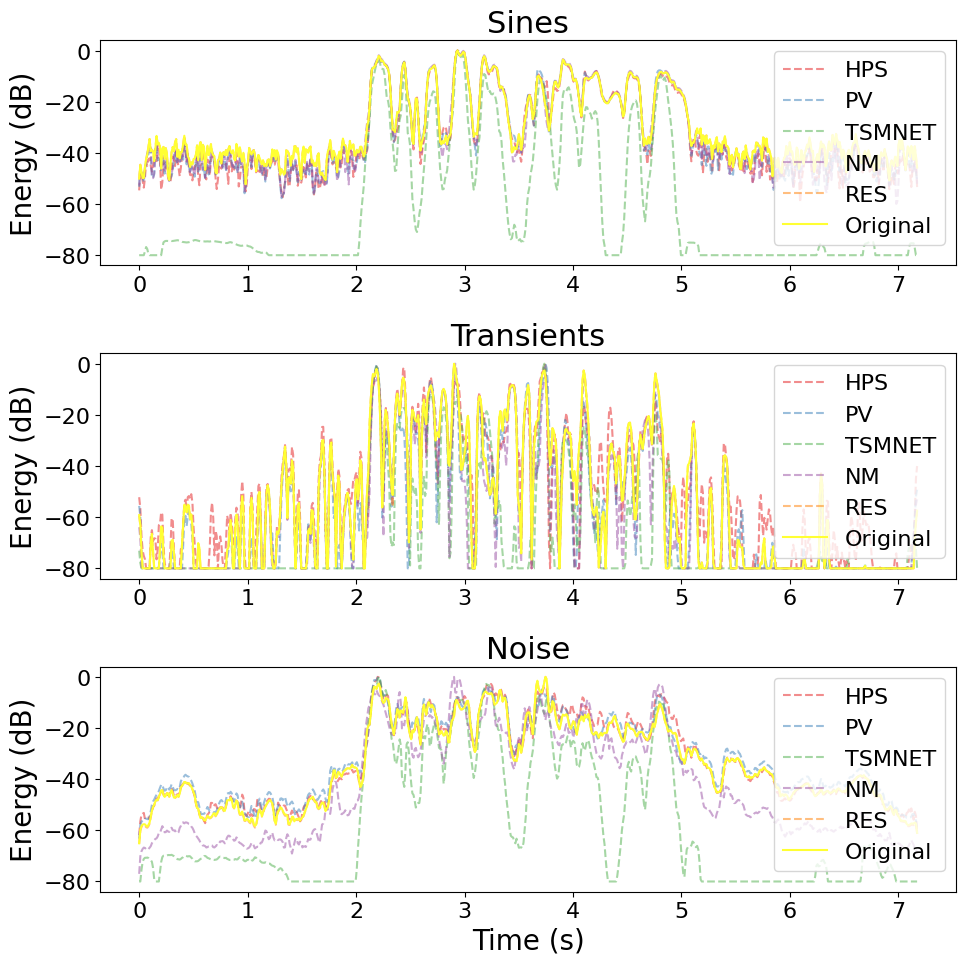

Running metrics for p225_020 with factor 12


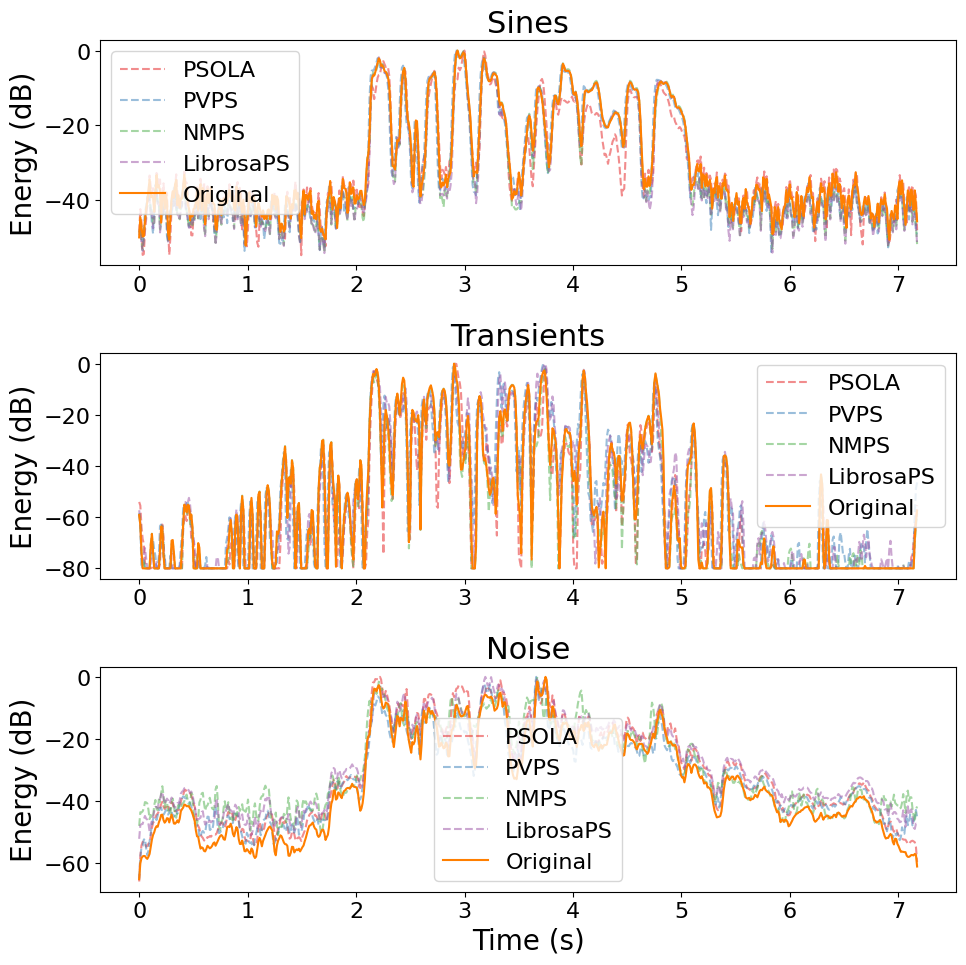

Running metrics for p226_020 with factor rt_up


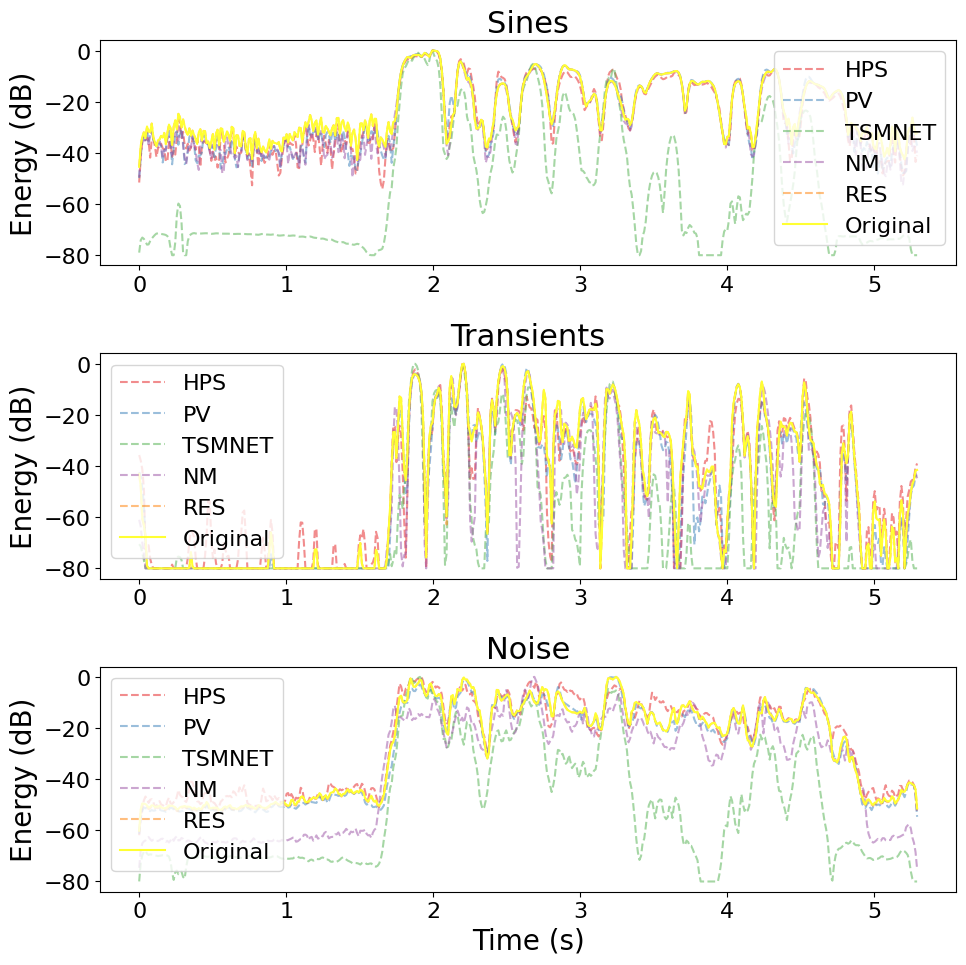

Running metrics for p226_020 with factor 12


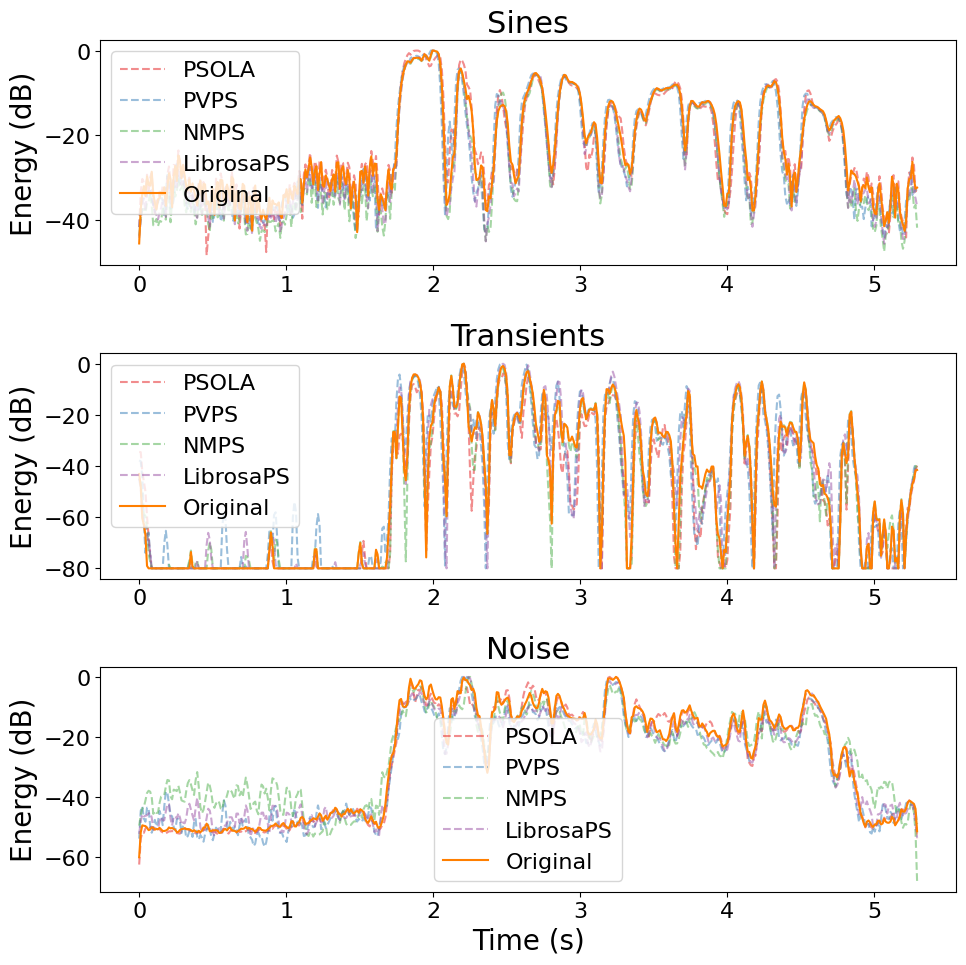

Running metrics for p227_020 with factor rt_up


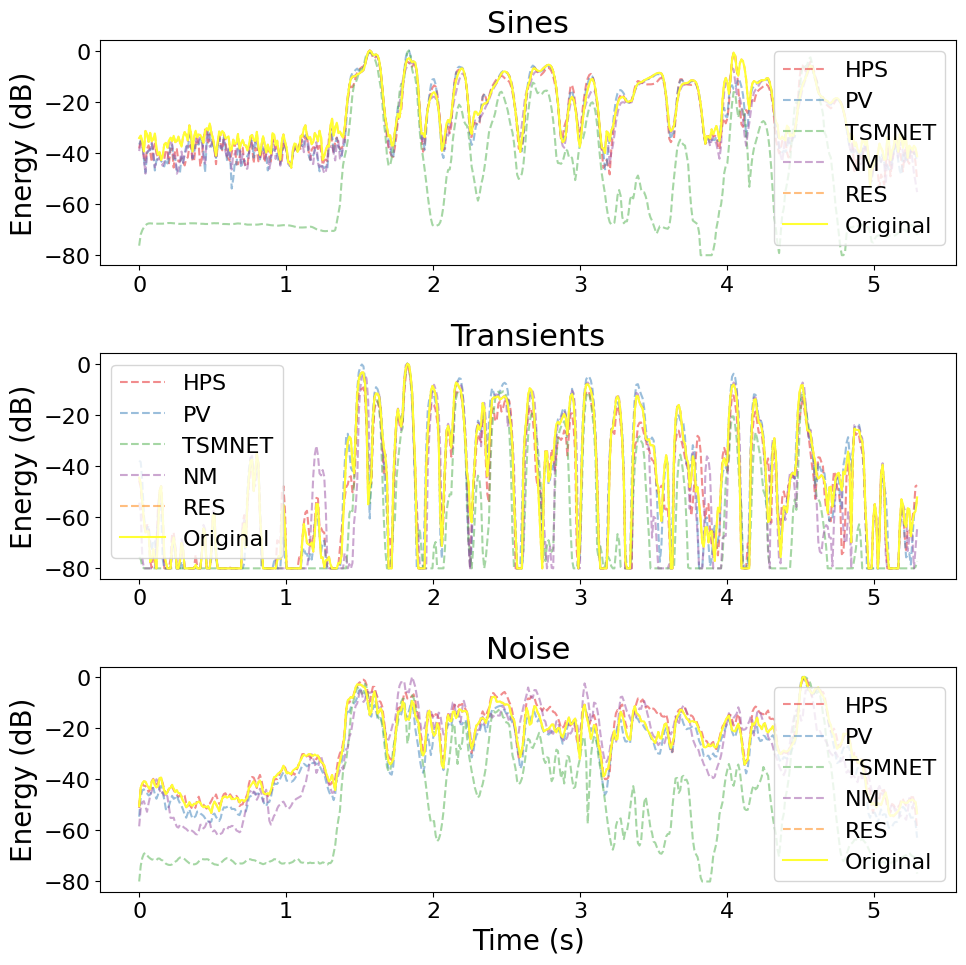

Running metrics for p227_020 with factor 12


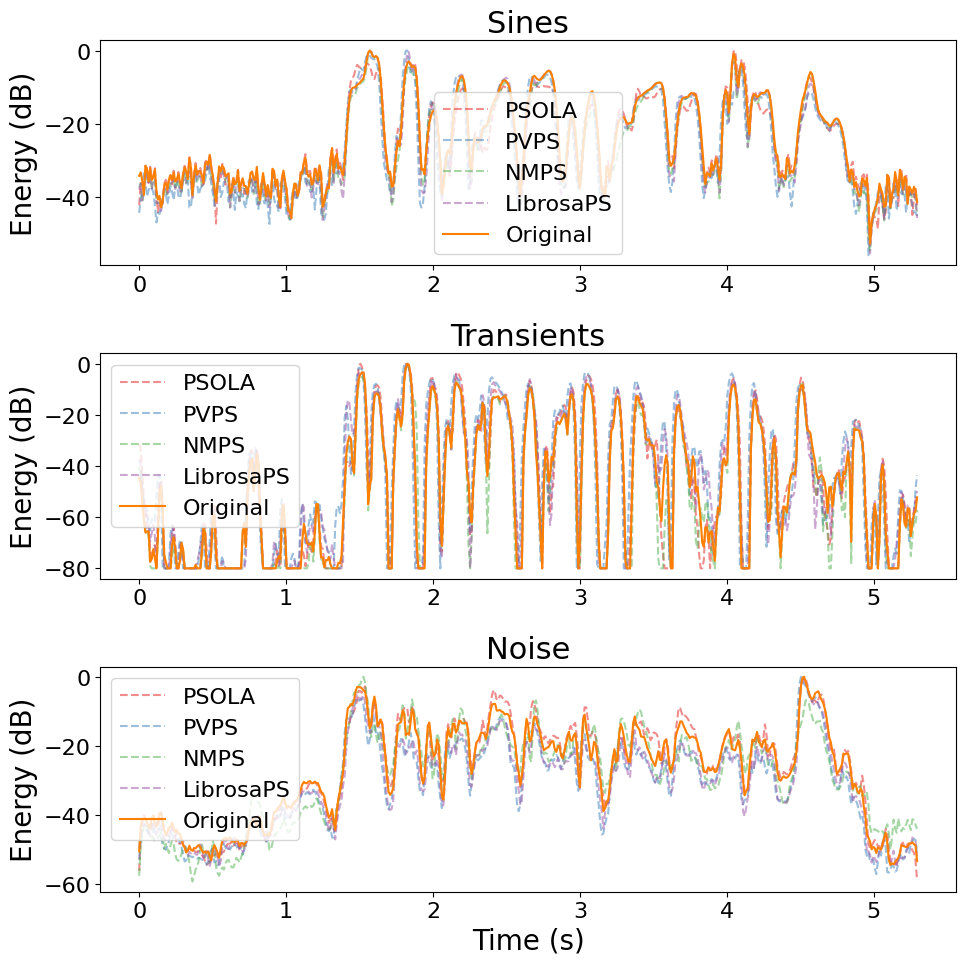

Running metrics for p225_019 with factor rt_up


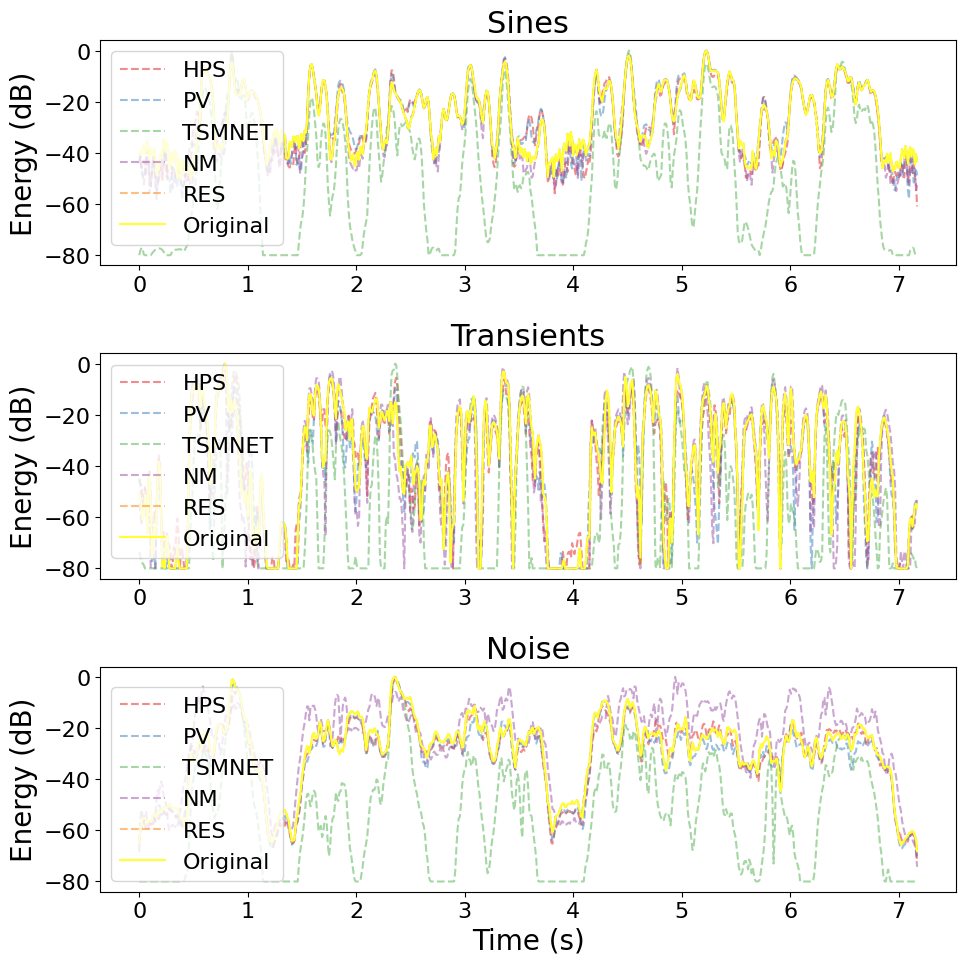

Running metrics for p225_019 with factor 12


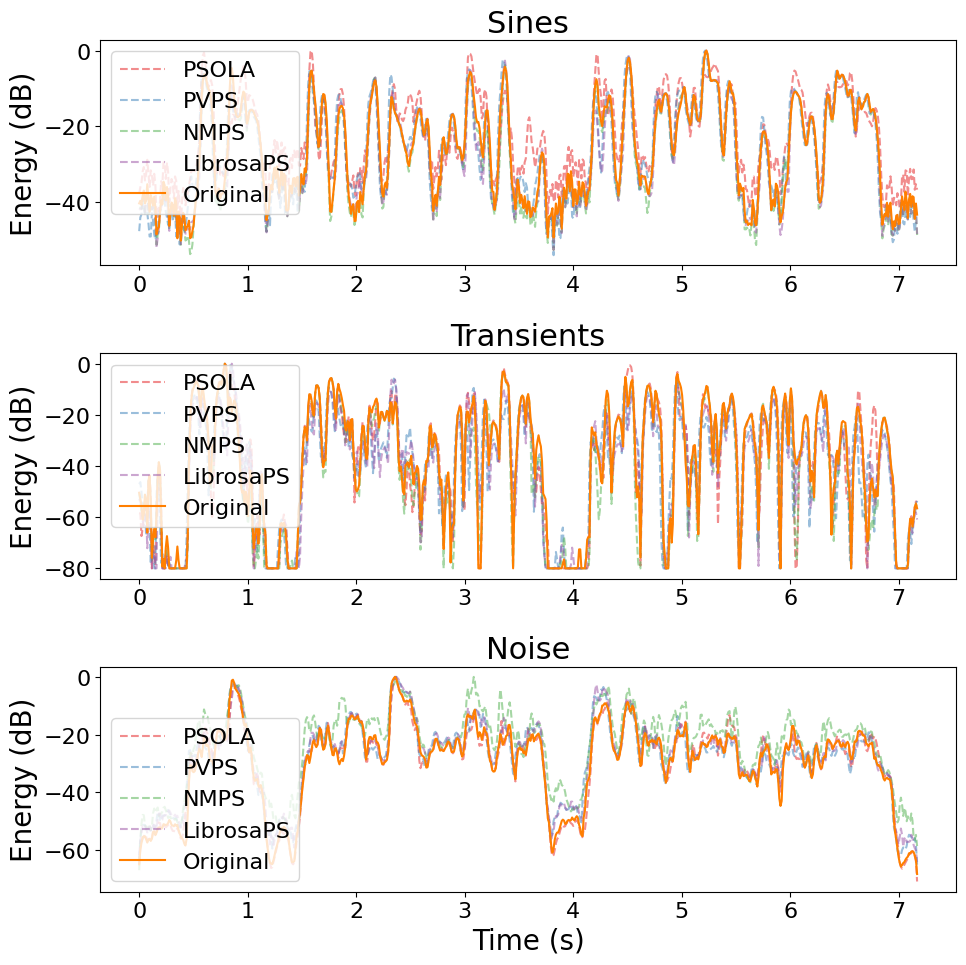

Running metrics for p226_019 with factor rt_up


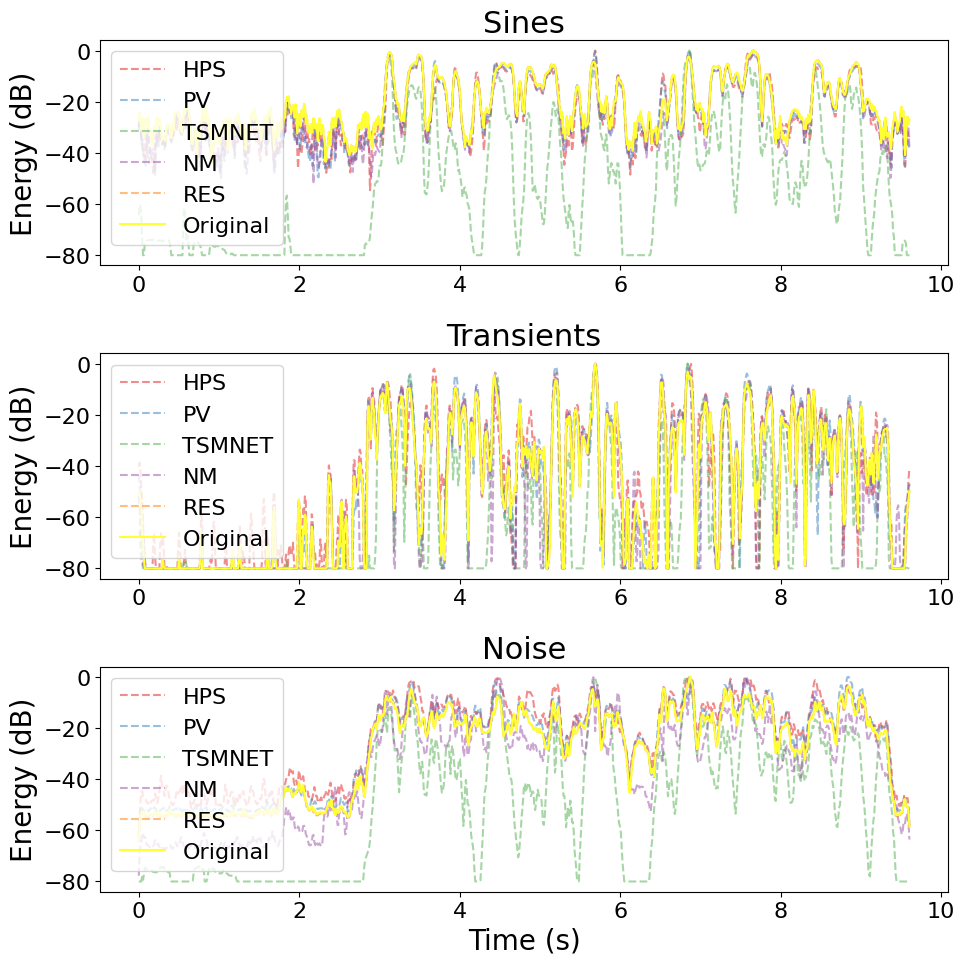

Running metrics for p226_019 with factor 12


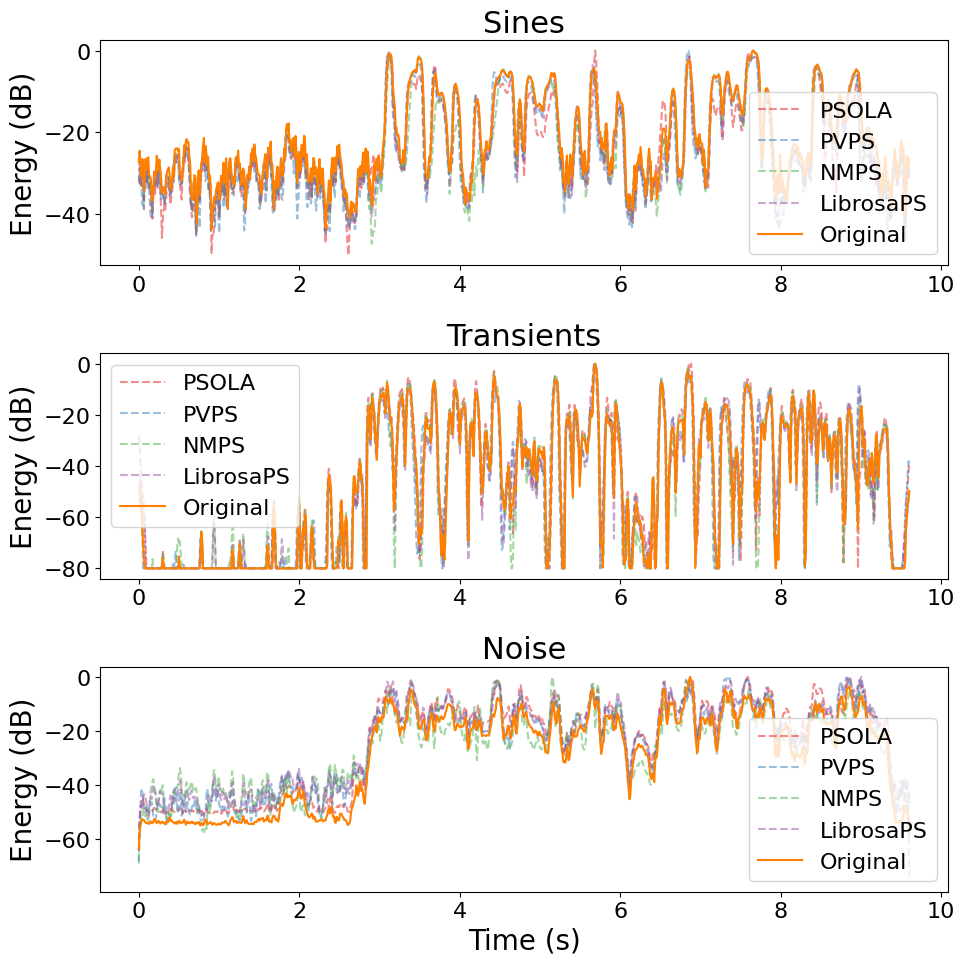

Running metrics for p227_019 with factor rt_up


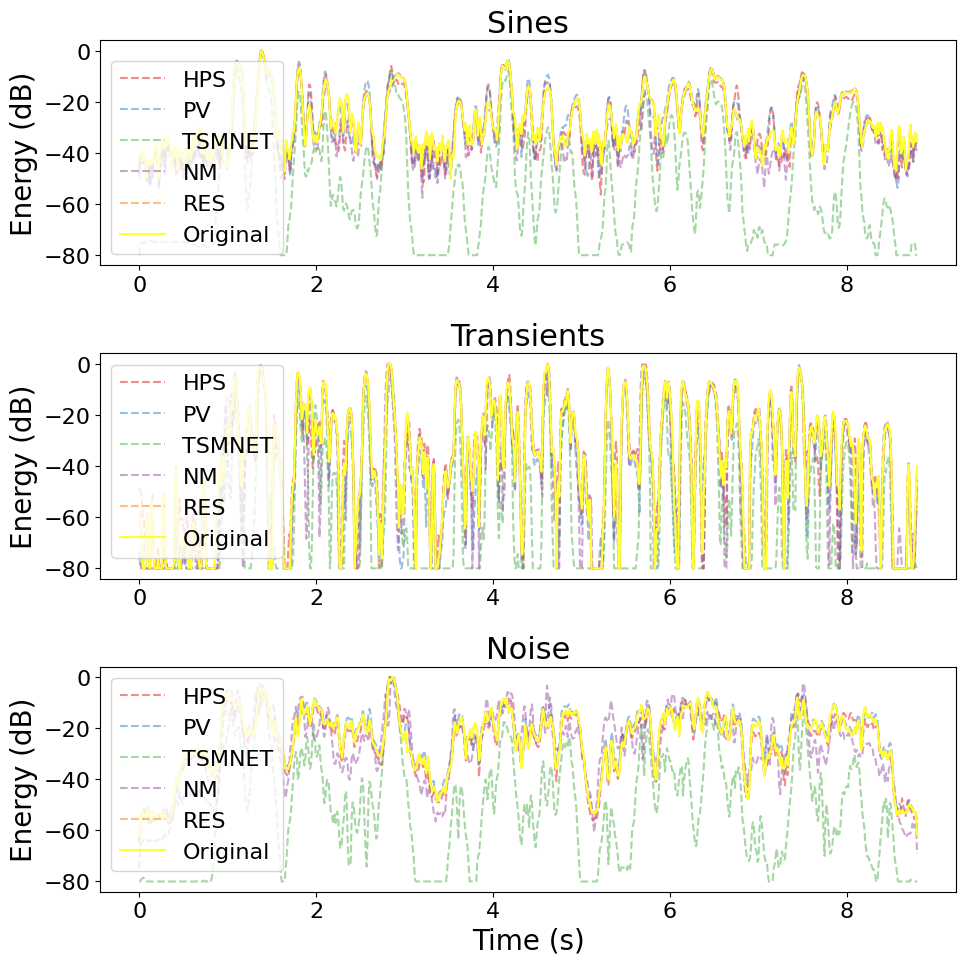

Running metrics for p227_019 with factor 12


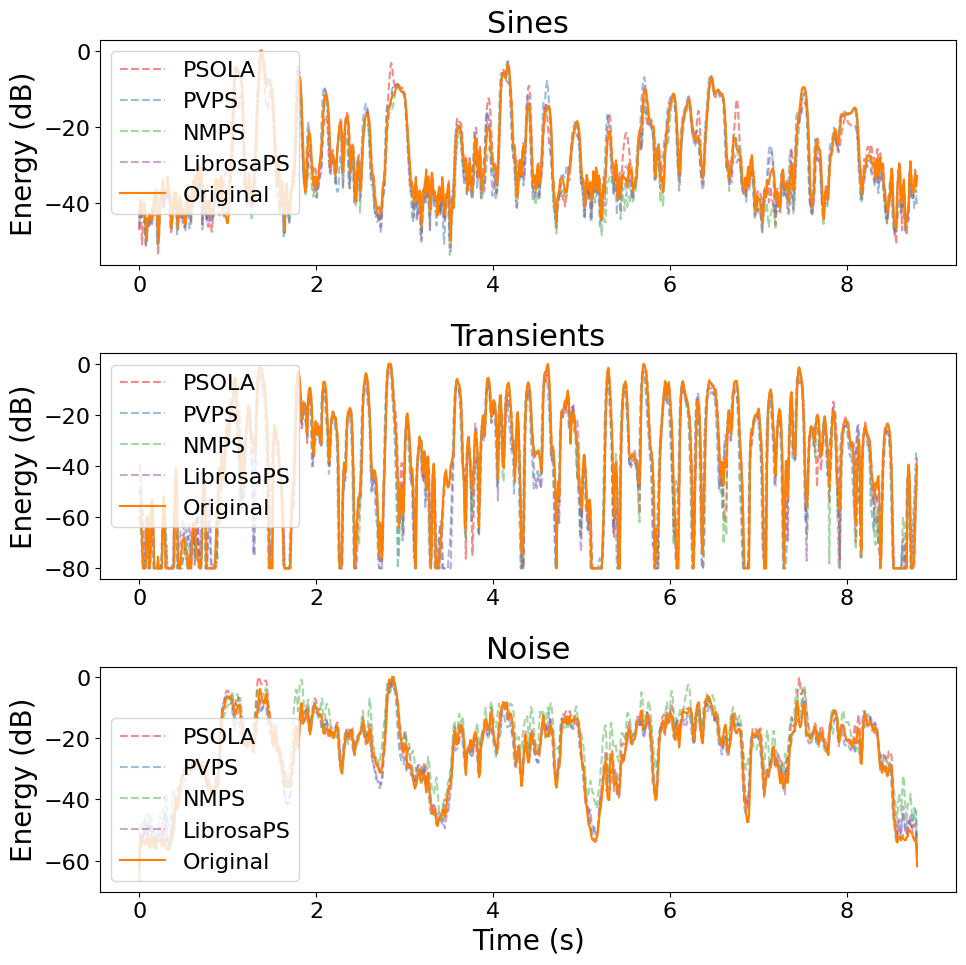

In [7]:
run_audio_metrics(files=['p225/p225_020.wav', 'p226/p226_020.wav', 'p227/p227_020.wav', 'p225/p225_019.wav', 'p226/p226_019.wav', 'p227/p227_019.wav'], factors_ps = [12], factors_tsm = ["rt_up"])

Running metrics for p225_020 with factor 12


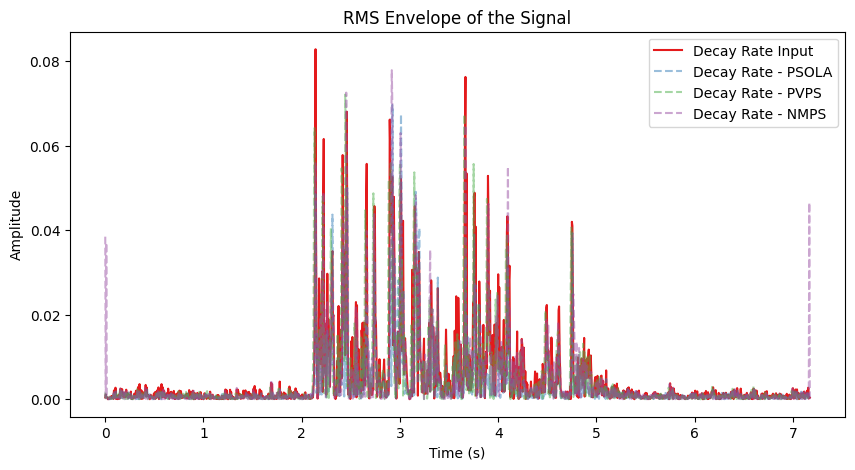

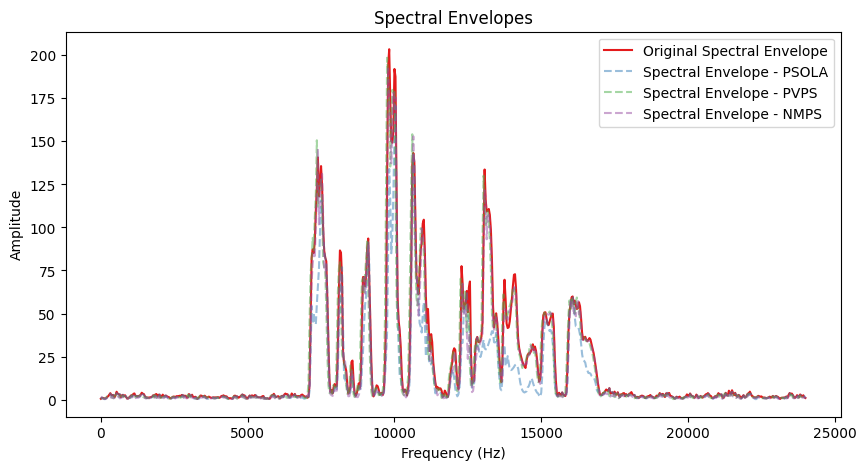

In [ ]:
run_audio_metrics(files=['p225/p225_020.wav'], factors_ps=[12], factors_tsm=[])

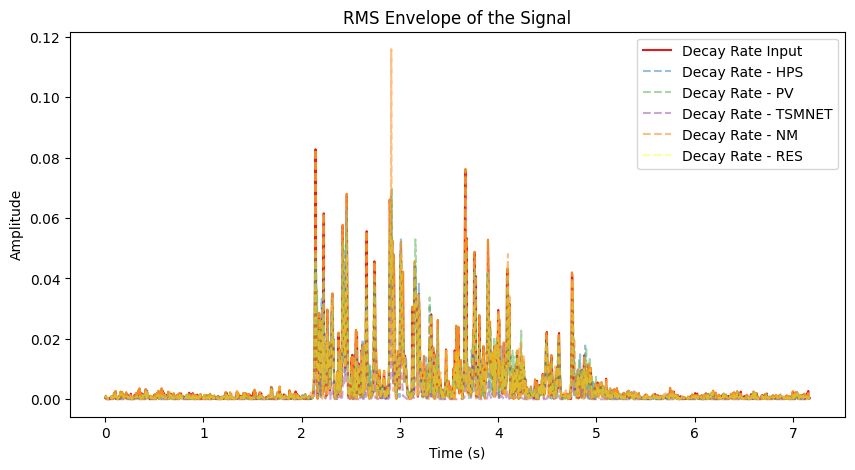

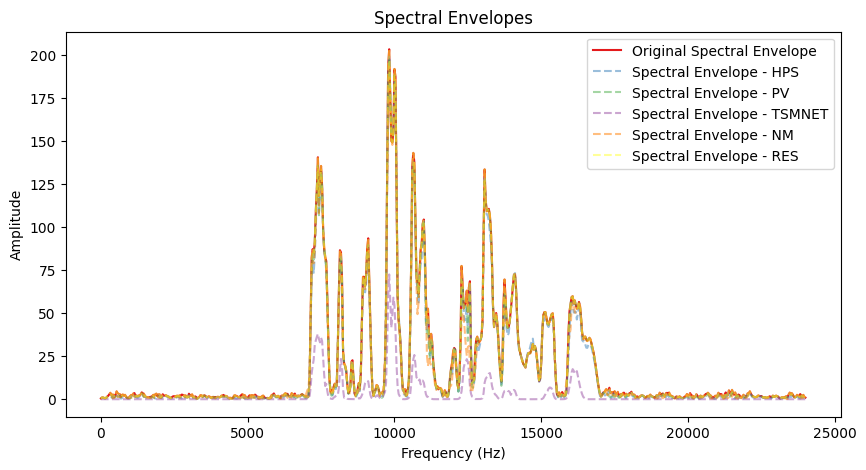

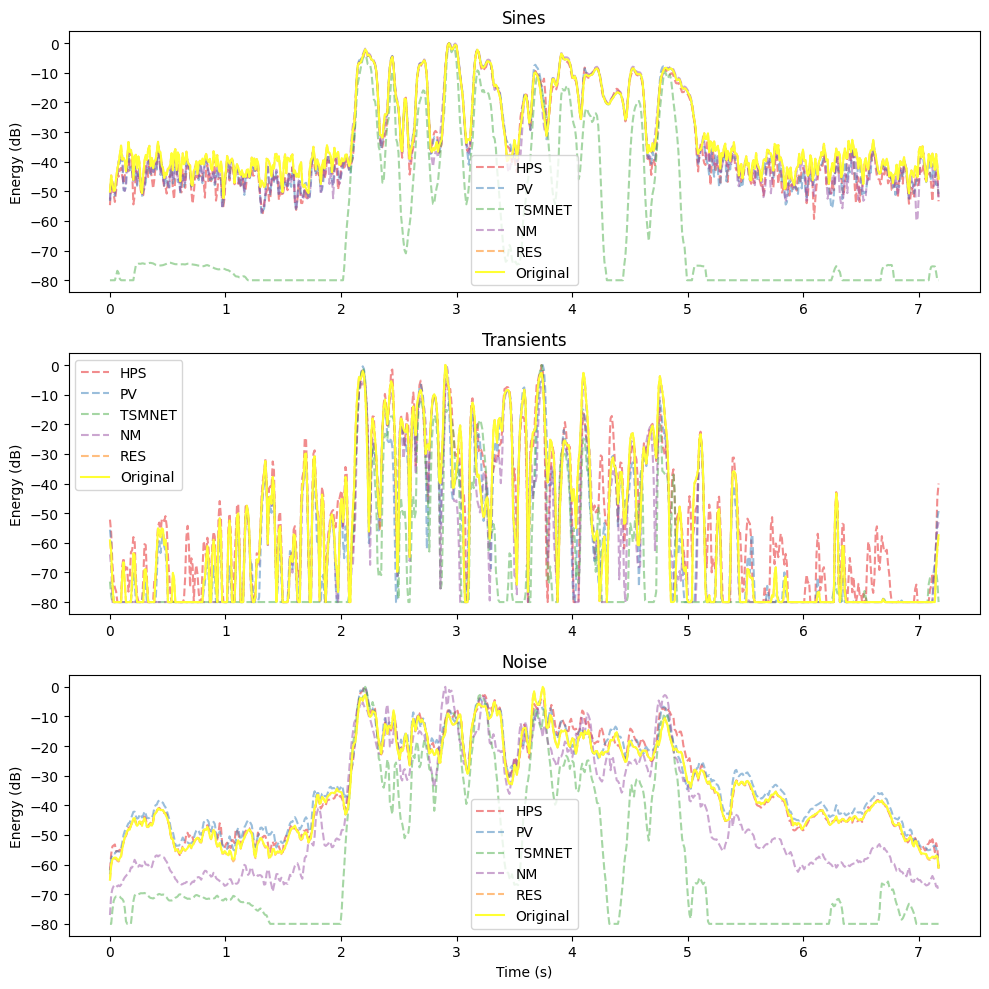

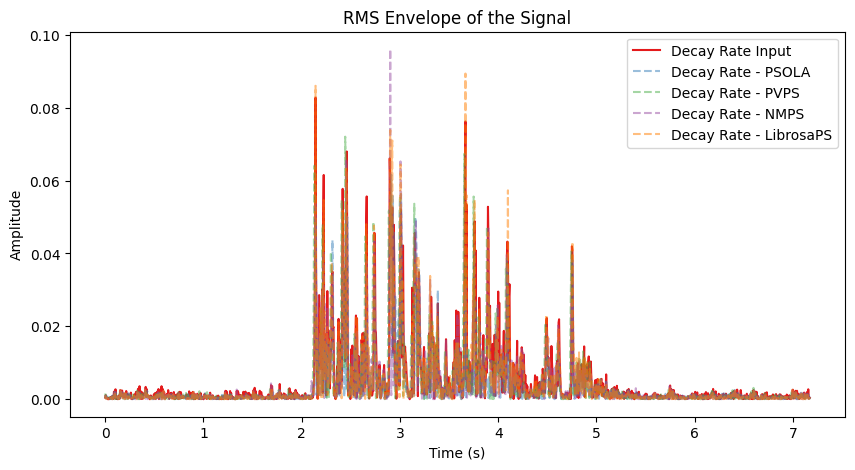

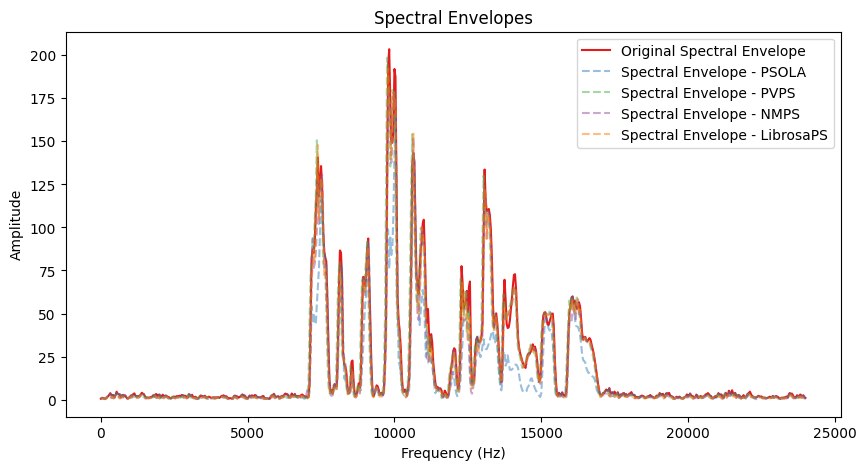

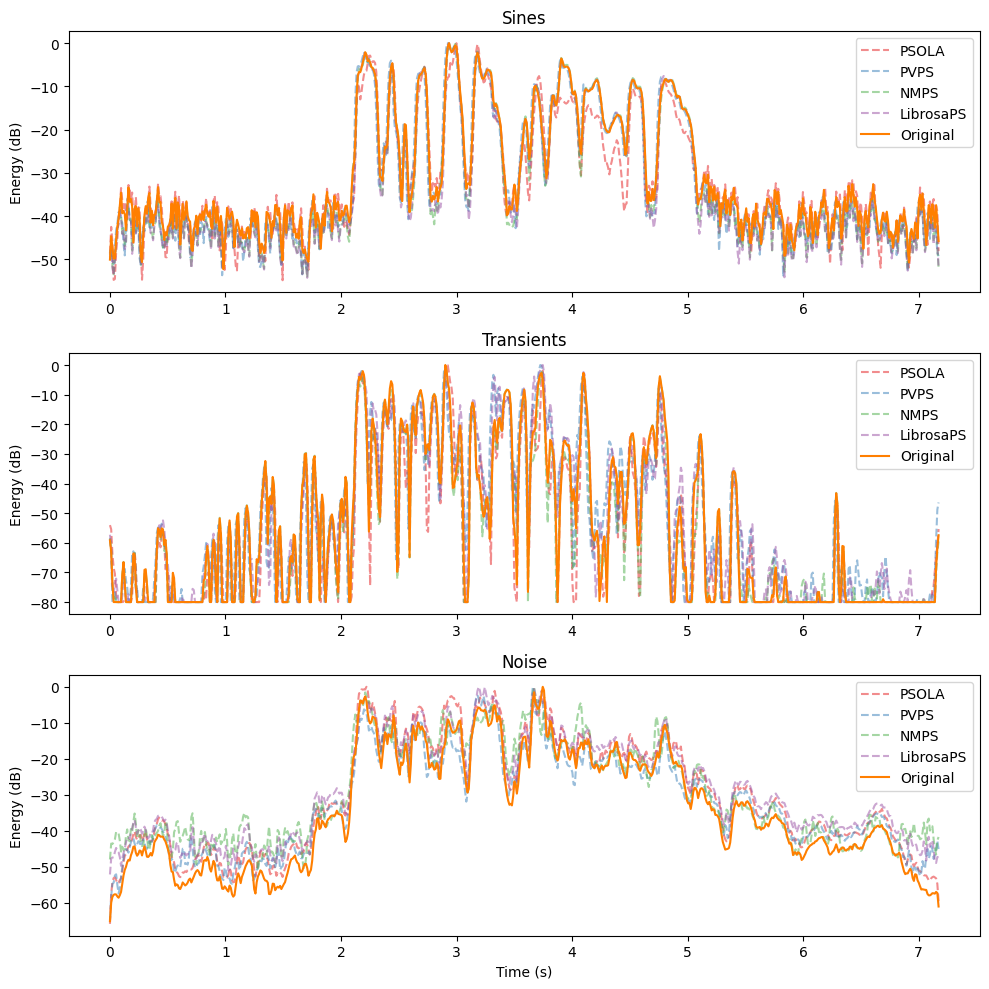

In [6]:
# run_audio_metrics(files=['p225/p225_020.wav'], factors_ps=[12], factors_tsm=["rt_up"])

Running metrics for p225_020 with TSM algorithm RES and factor rt_up


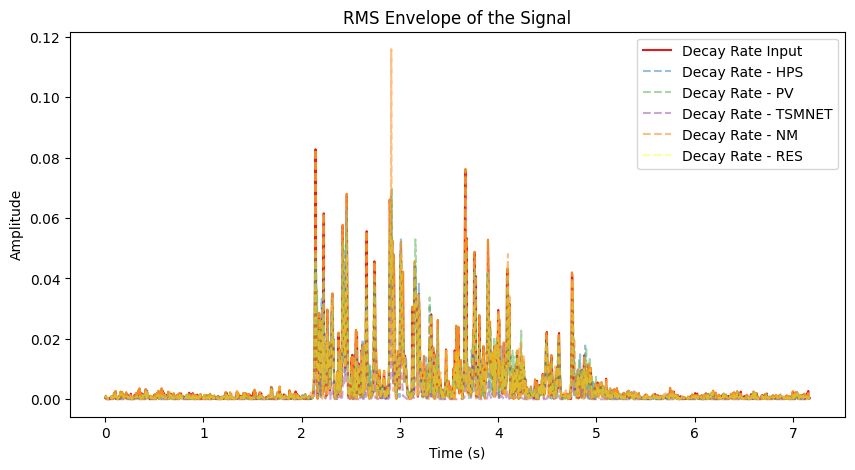

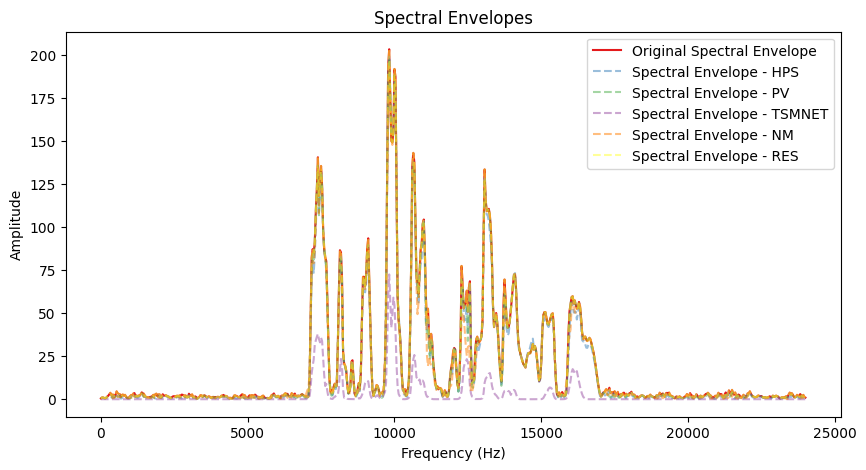

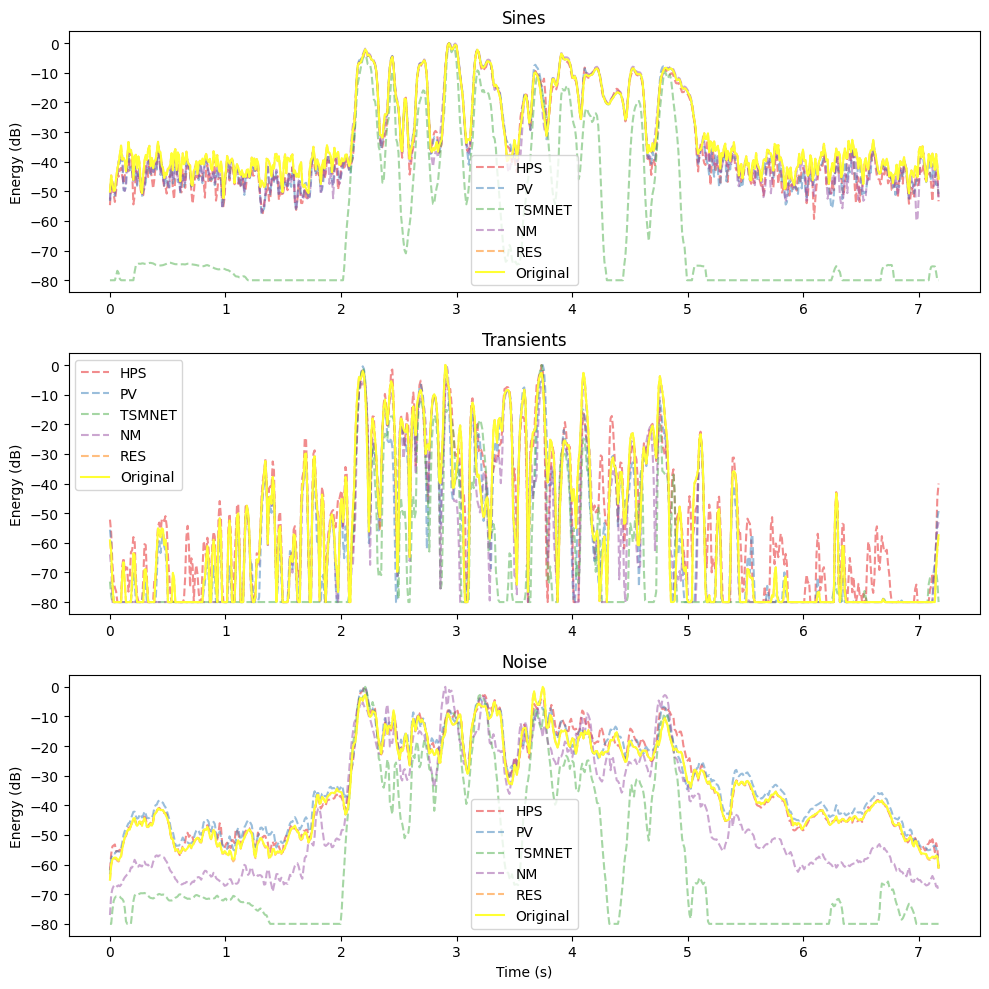

Running metrics for p225_020 with TSM algorithm RES and factor rt_down


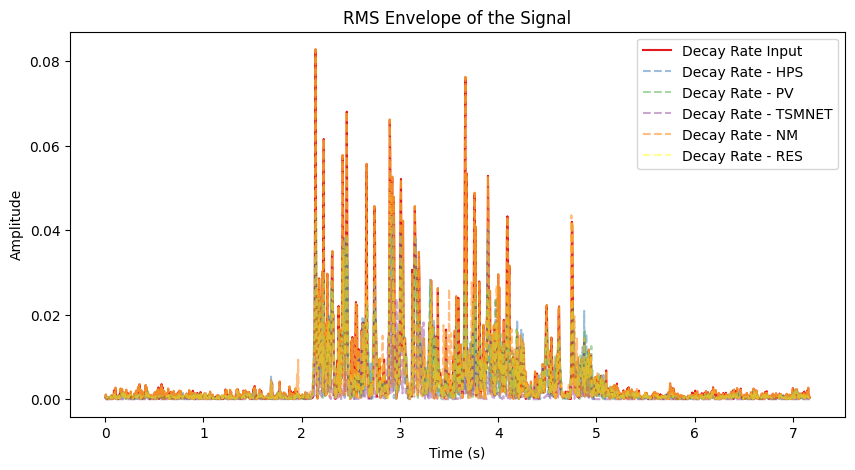

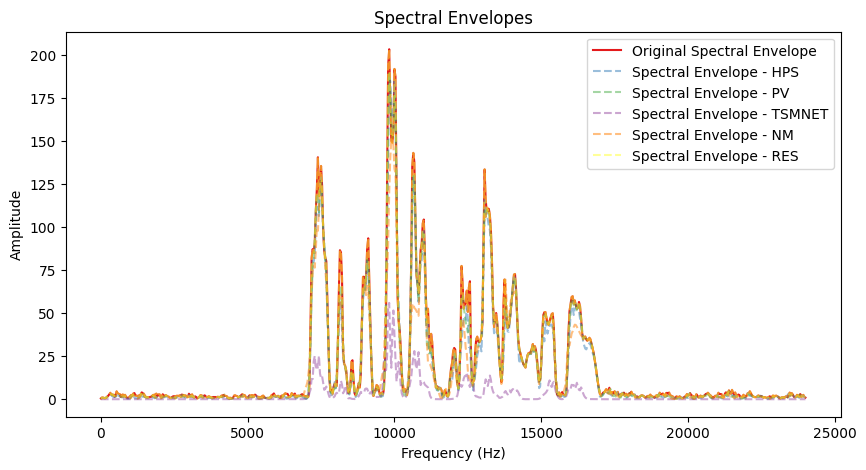

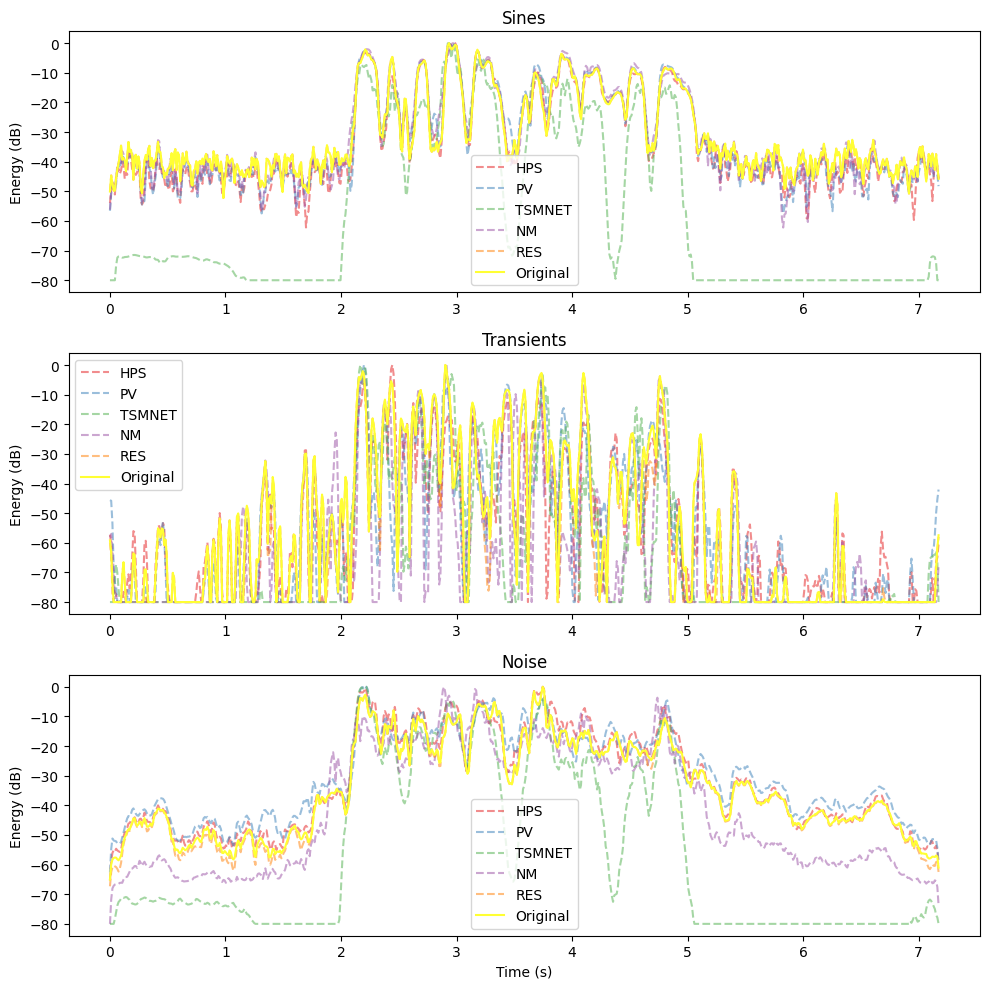

Running metrics for p225_020 with PS algorithm LibrosaPS and factor -12


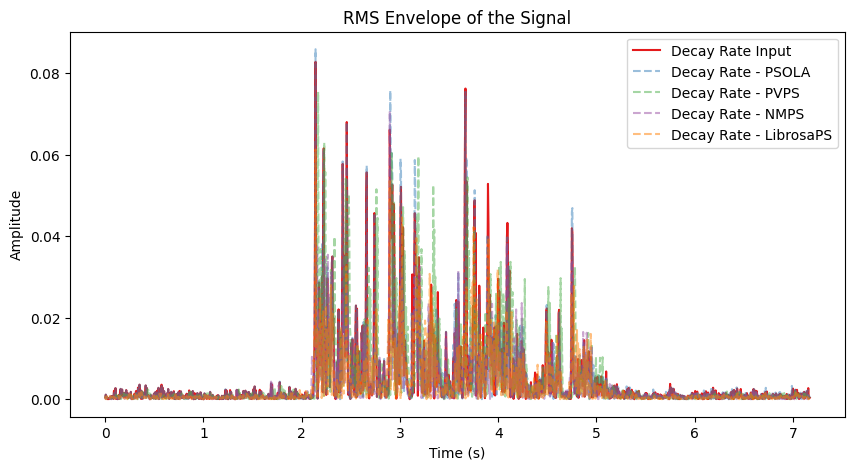

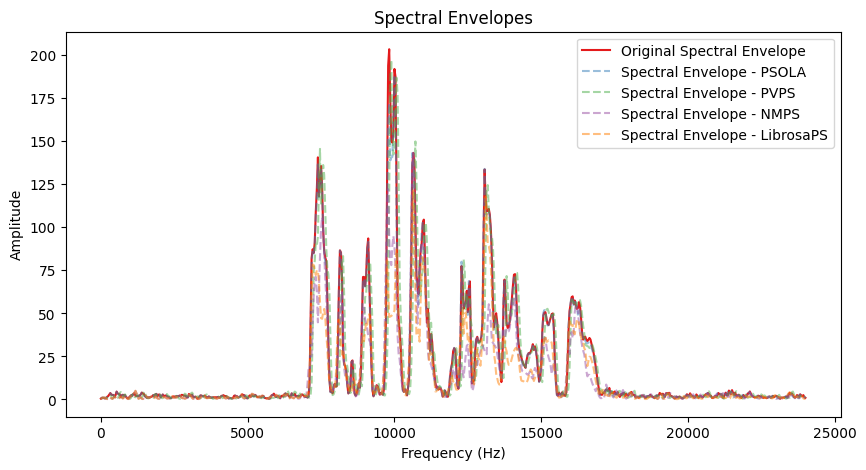

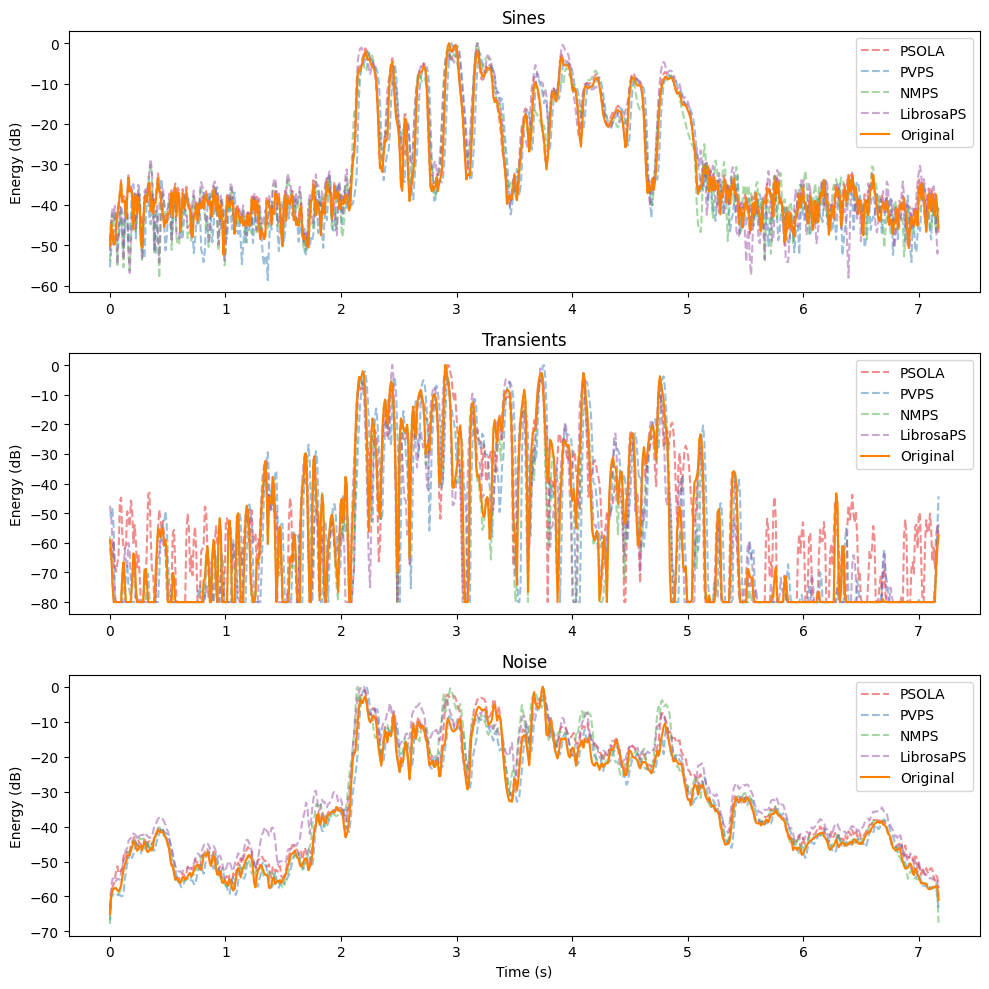

Running metrics for p225_020 with PS algorithm LibrosaPS and factor 7


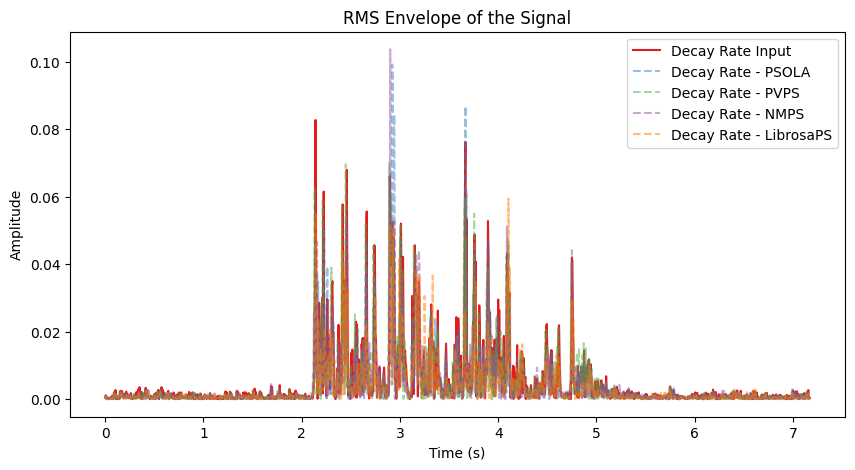

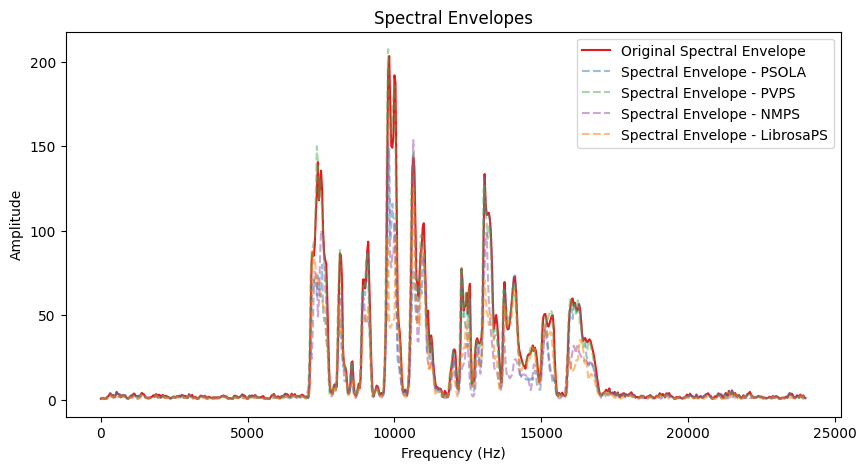

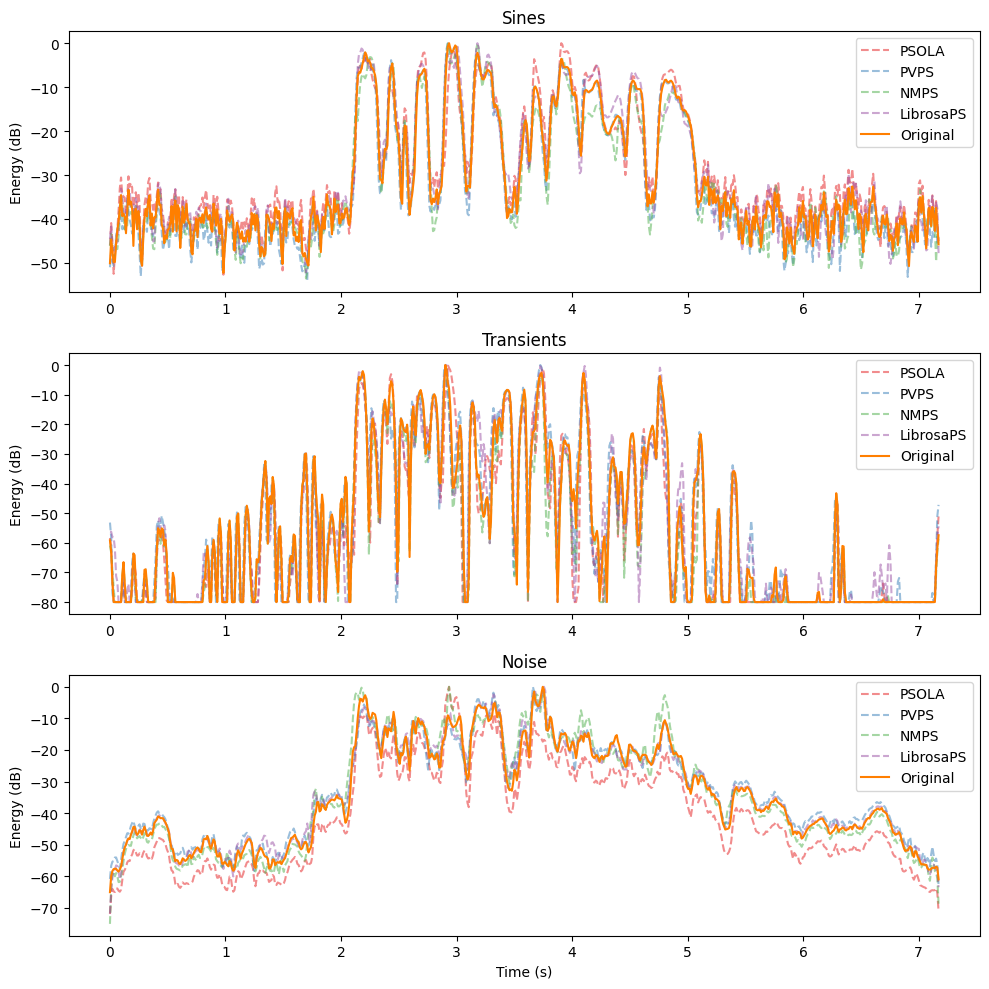

Running metrics for p225_020 with PS algorithm LibrosaPS and factor 12


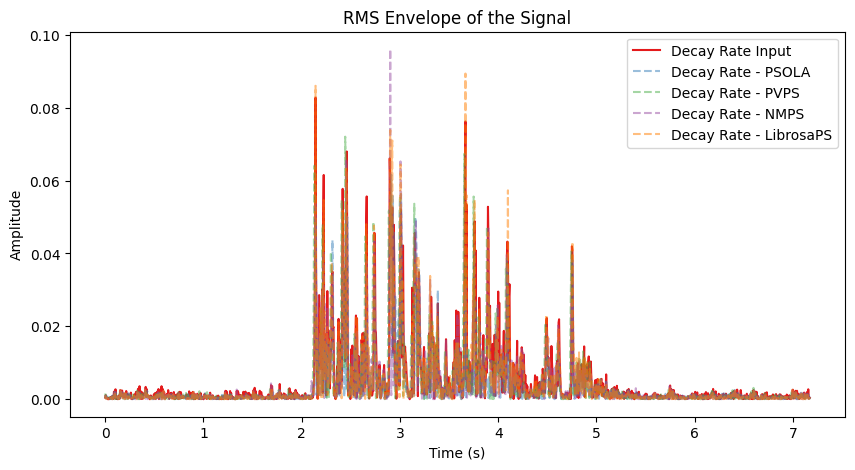

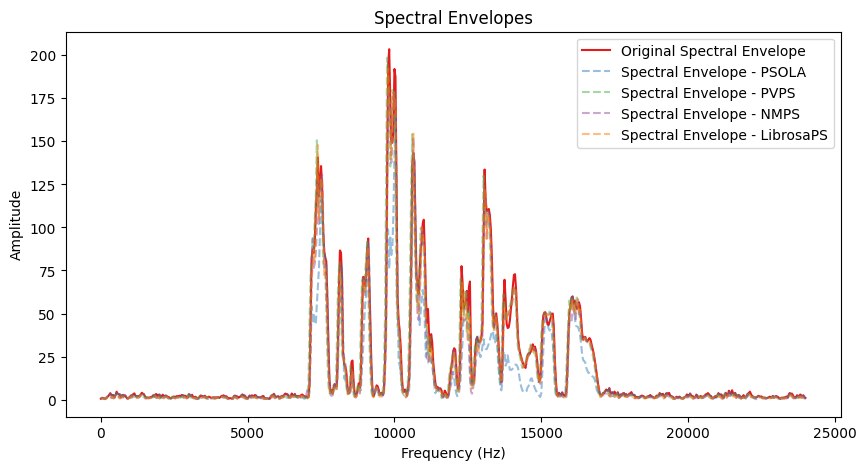

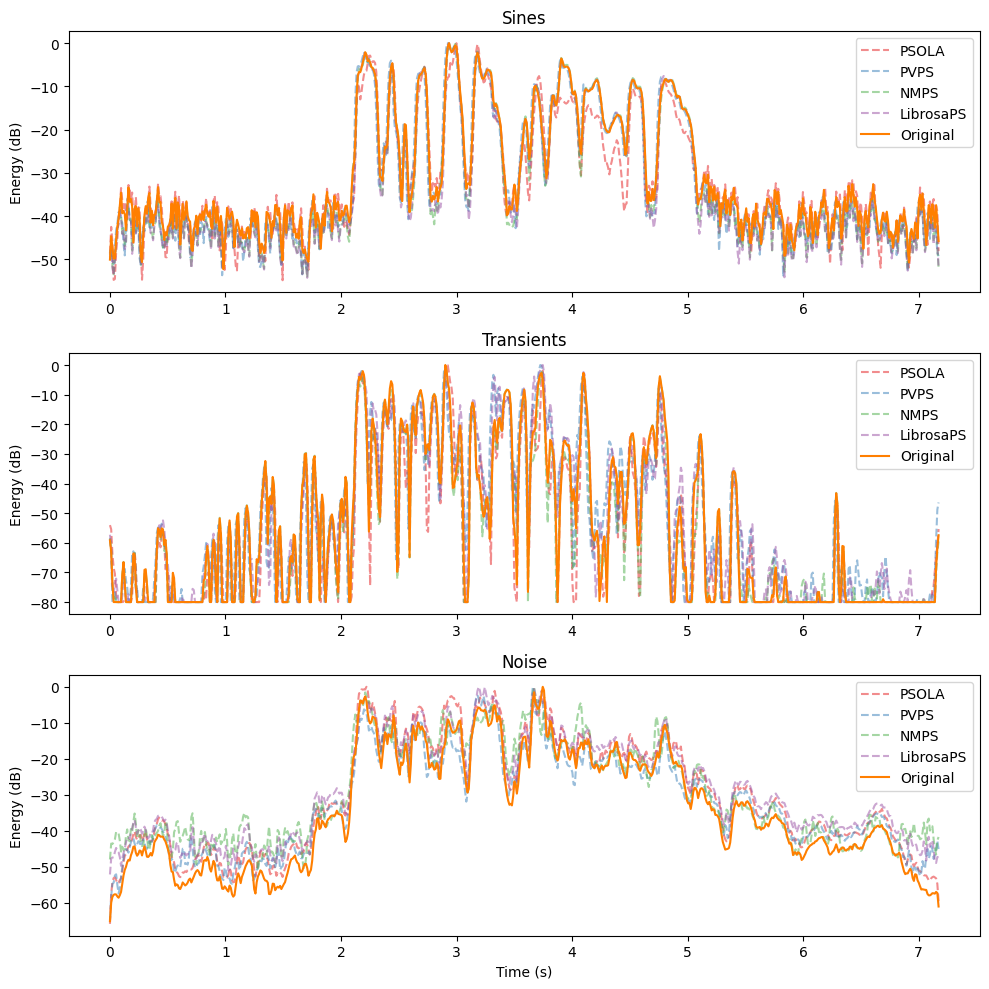

Running metrics for p226_020 with TSM algorithm RES and factor rt_up


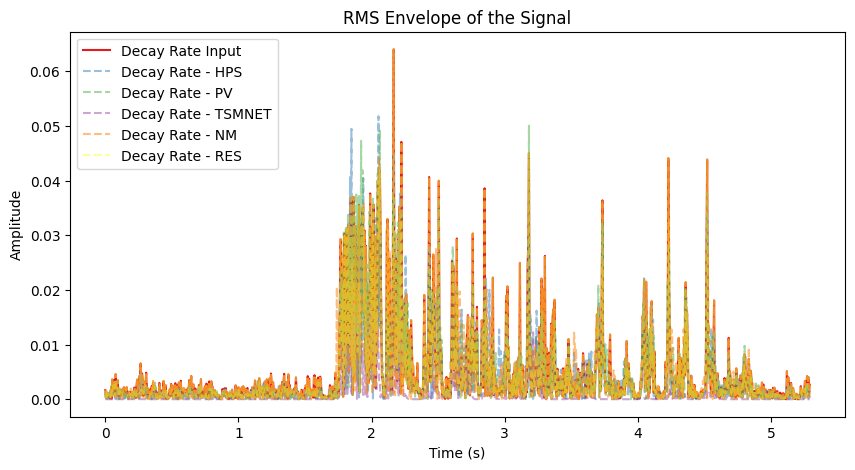

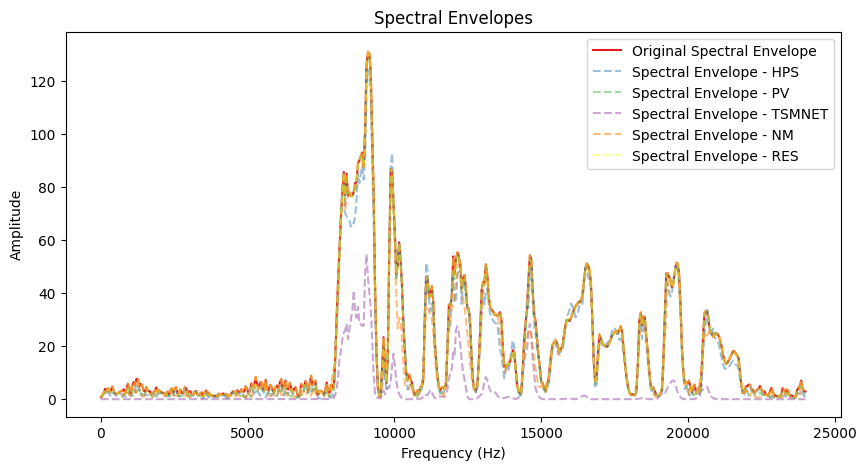

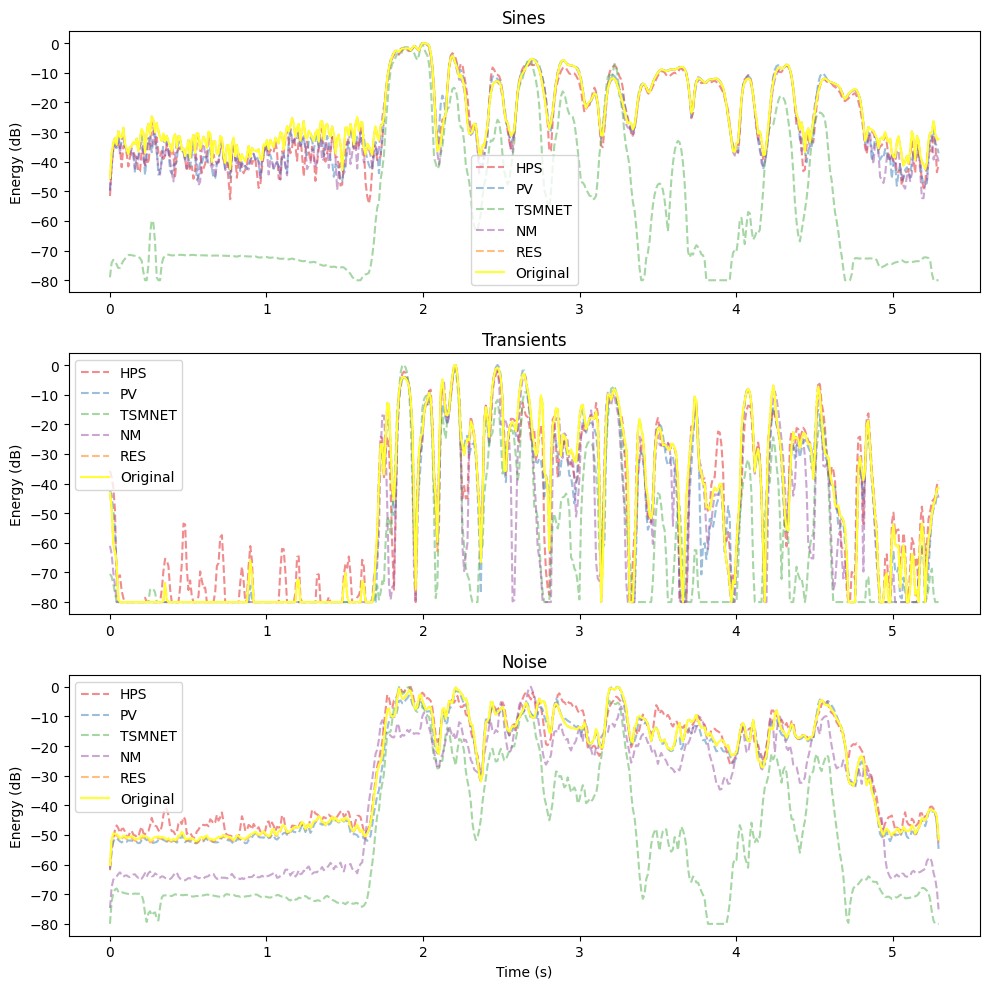

Running metrics for p226_020 with TSM algorithm RES and factor rt_down


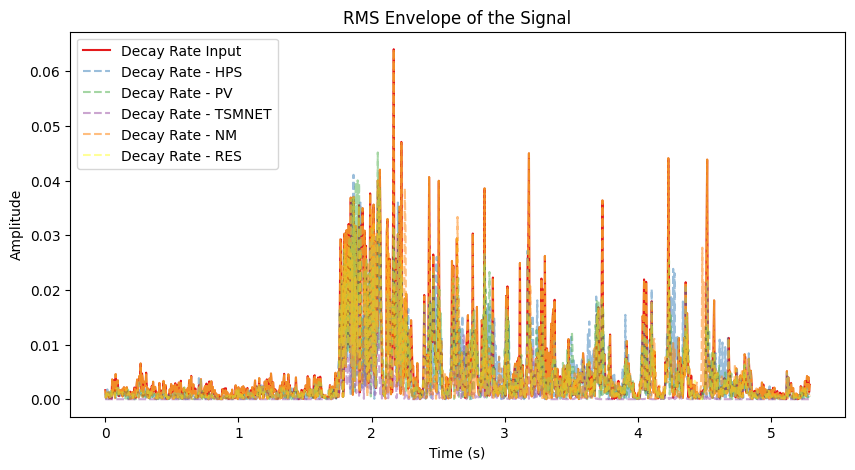

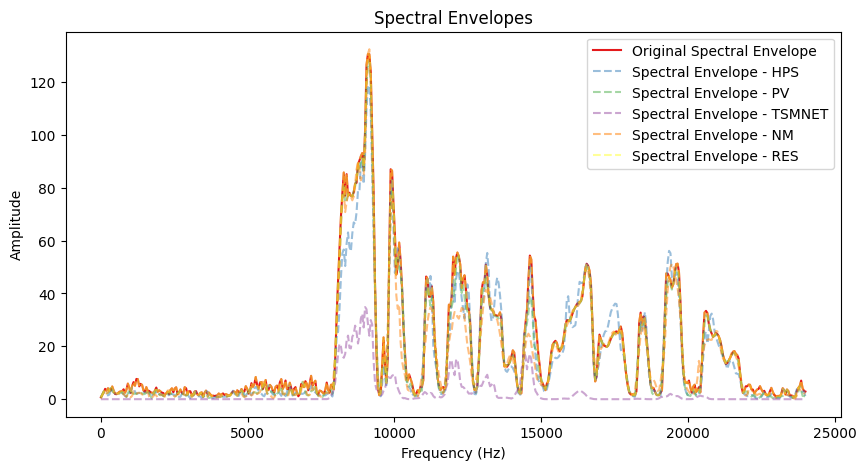

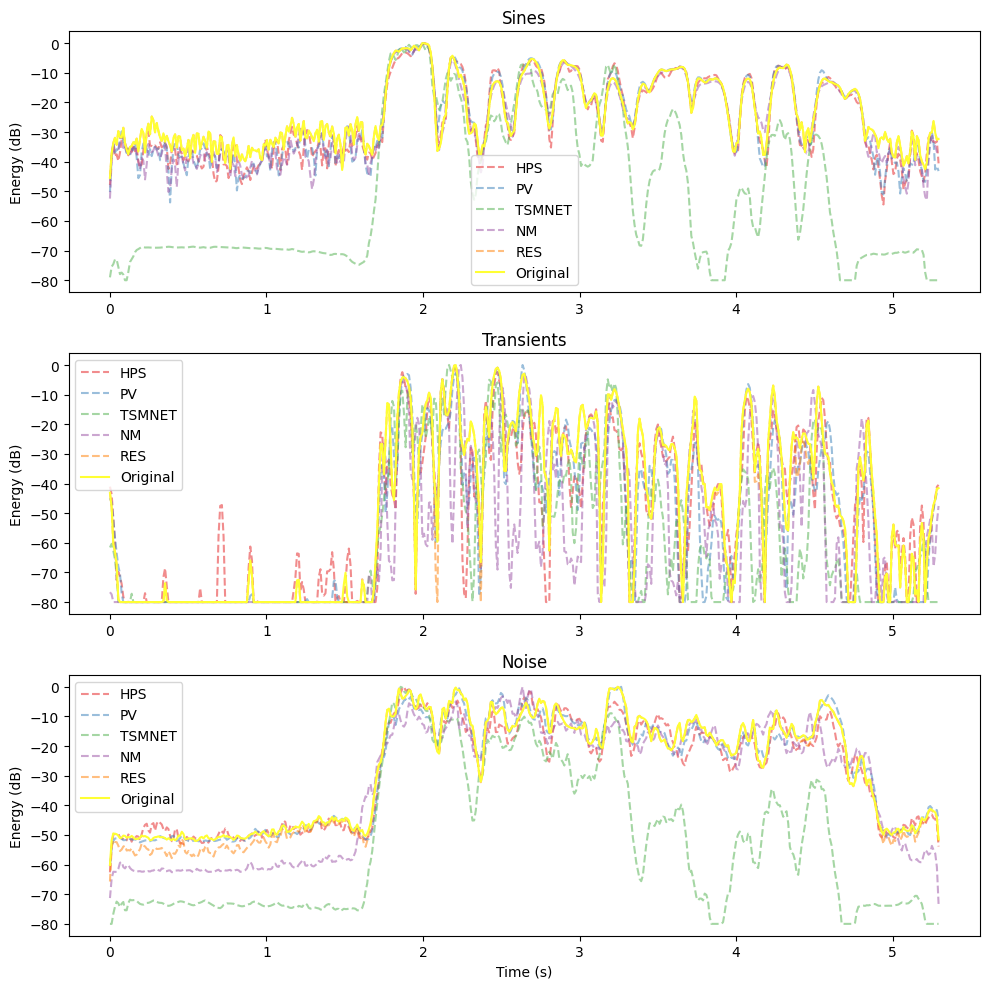

Running metrics for p226_020 with PS algorithm LibrosaPS and factor -12


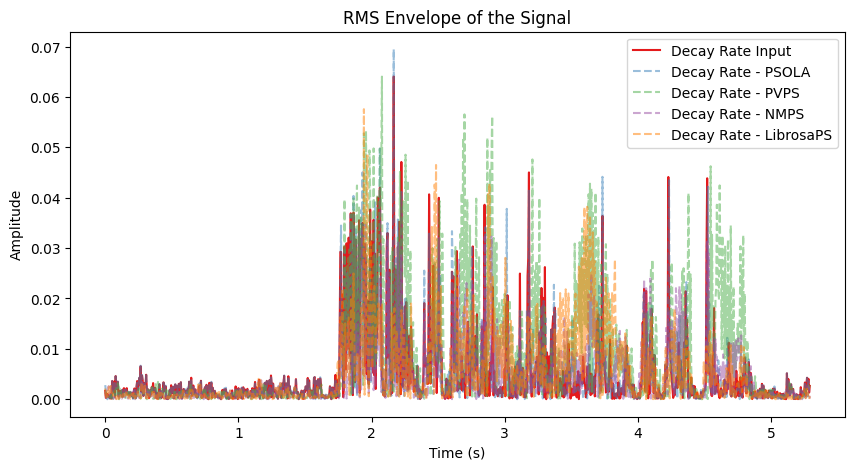

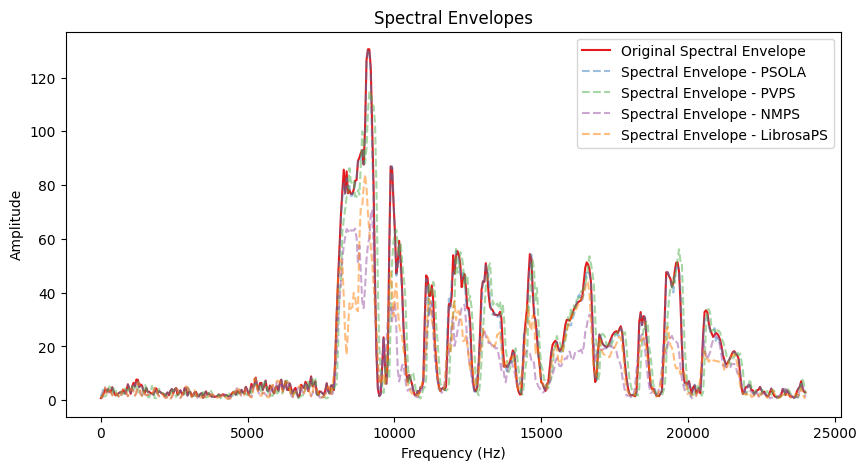

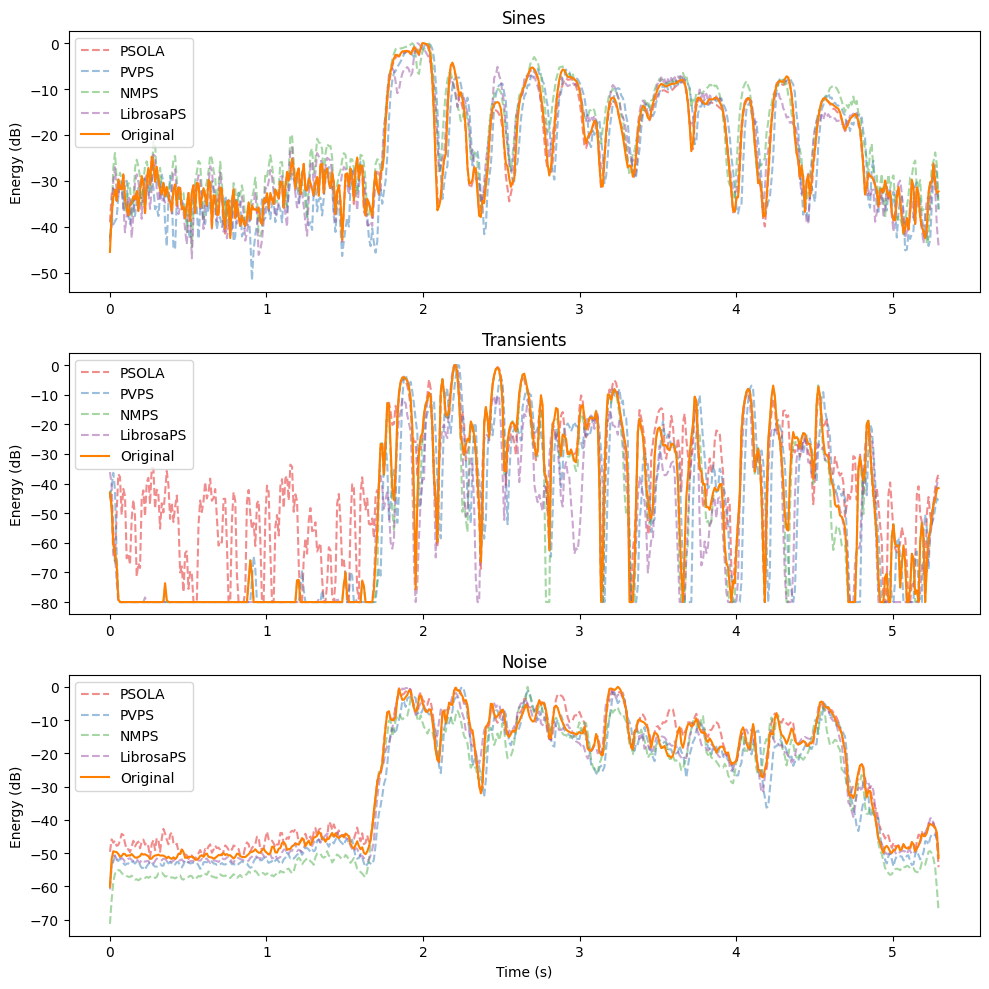

Running metrics for p226_020 with PS algorithm LibrosaPS and factor 7


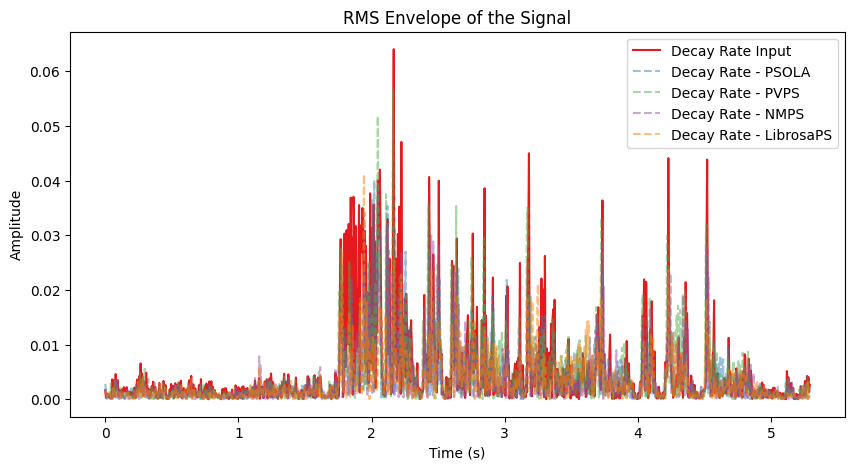

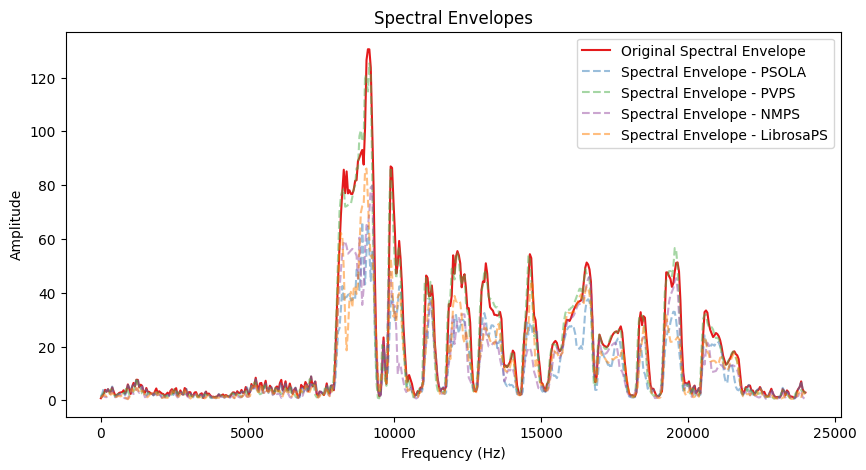

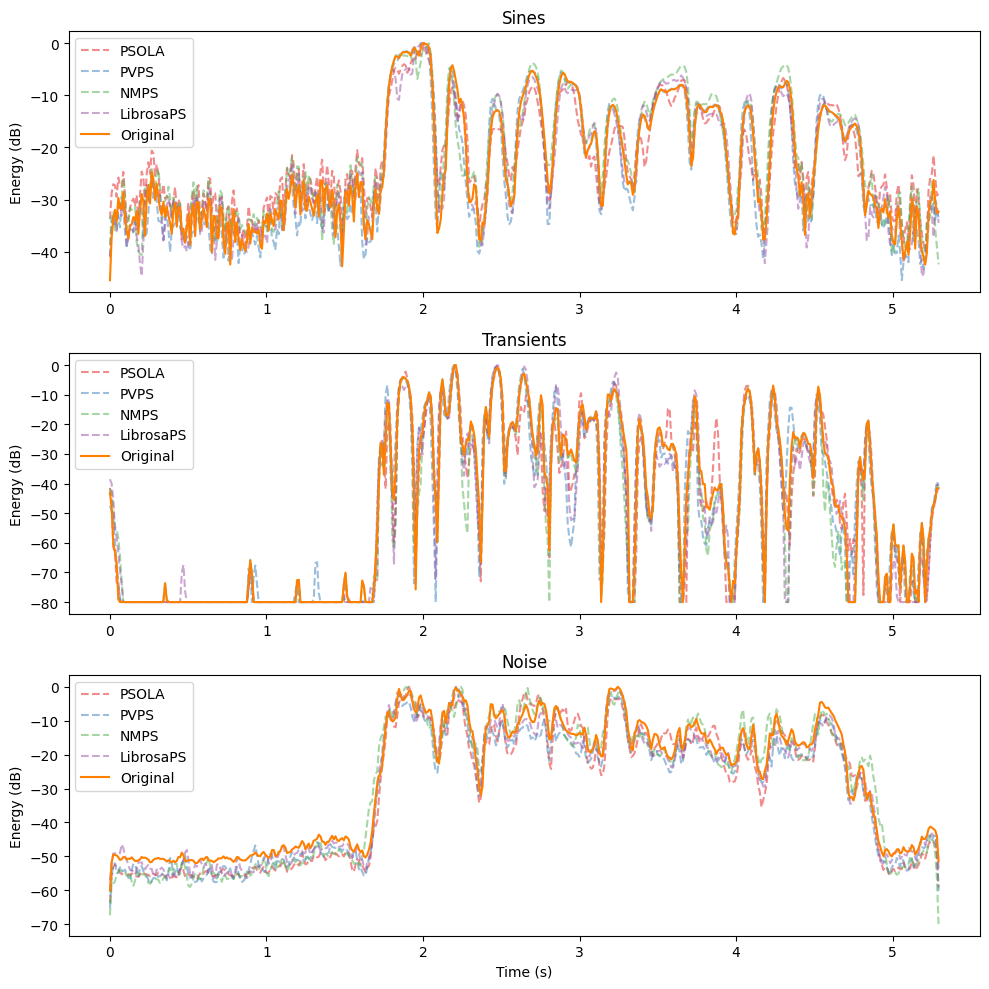

Running metrics for p226_020 with PS algorithm LibrosaPS and factor 12


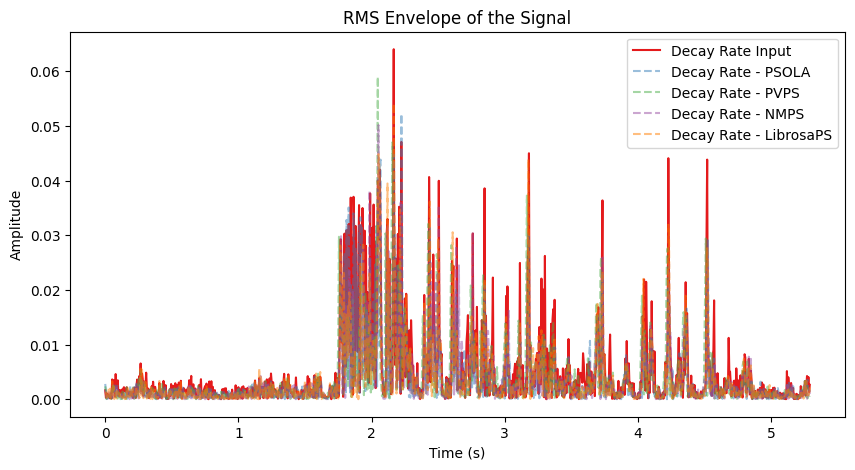

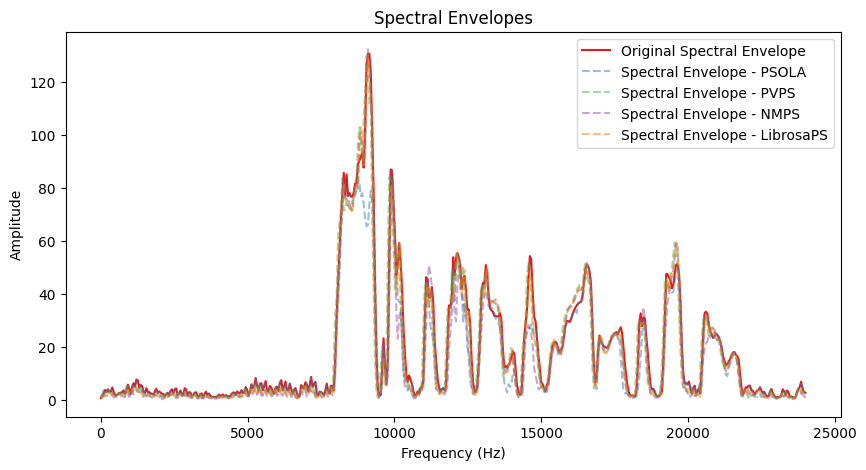

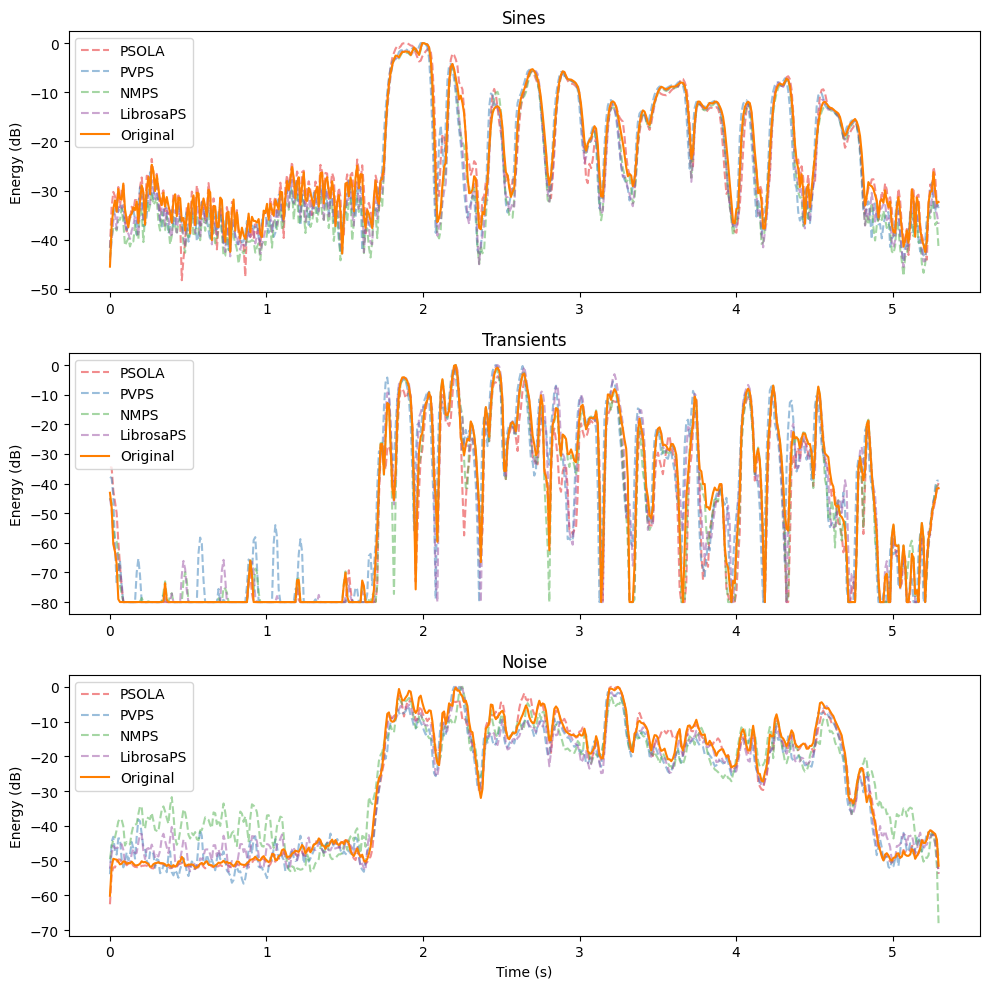

Running metrics for p227_020 with TSM algorithm RES and factor rt_up


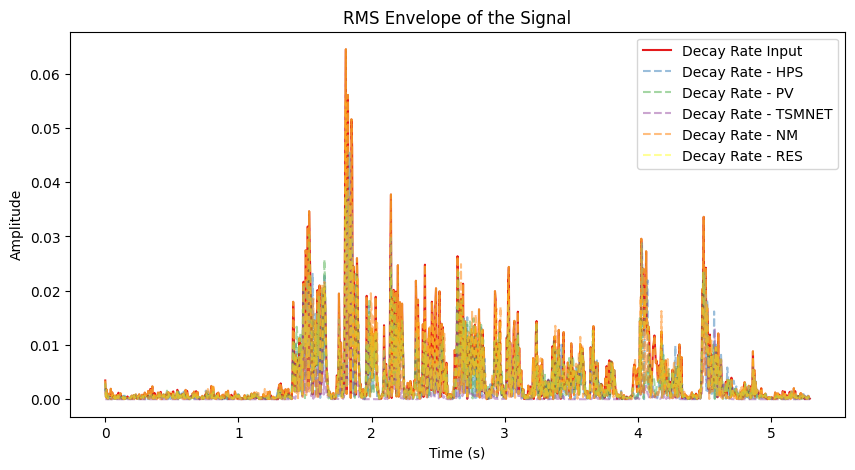

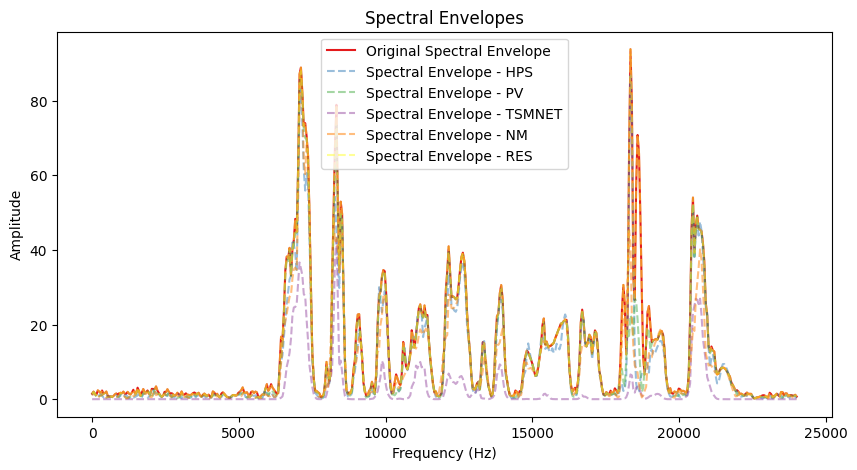

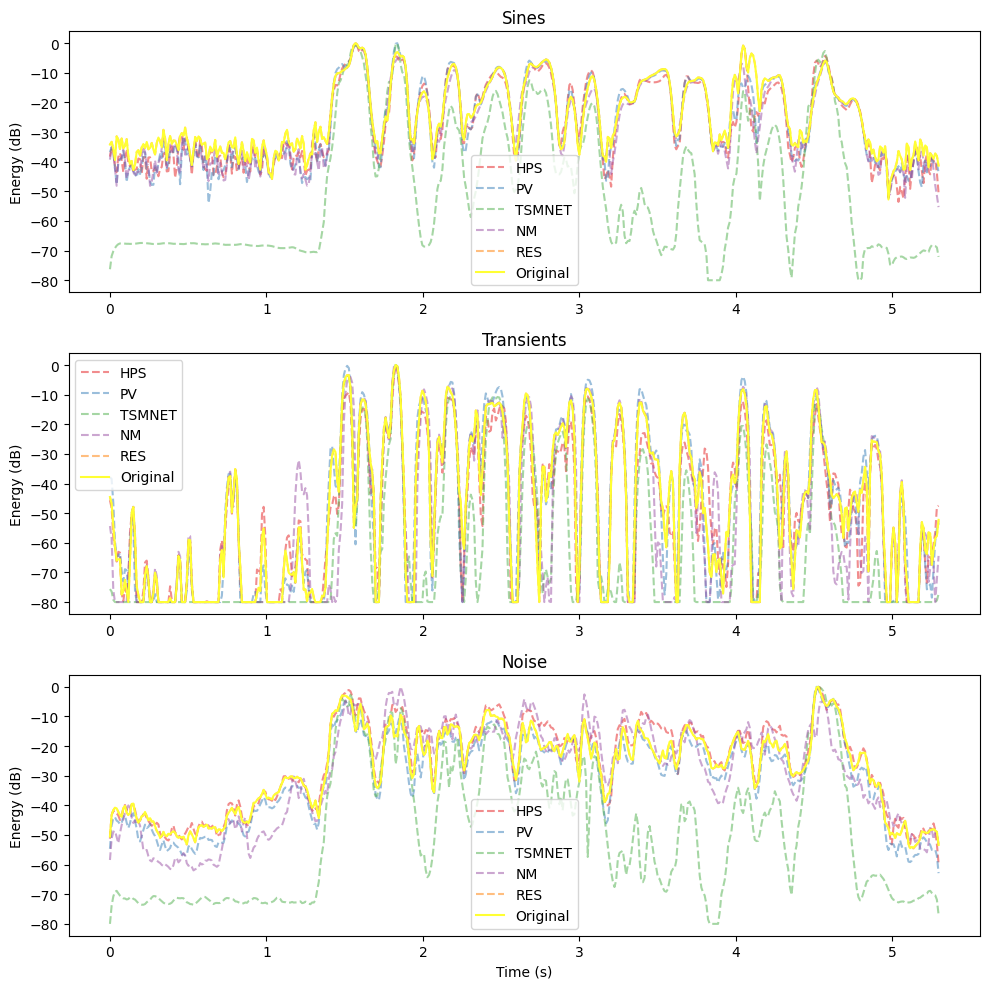

Running metrics for p227_020 with TSM algorithm RES and factor rt_down


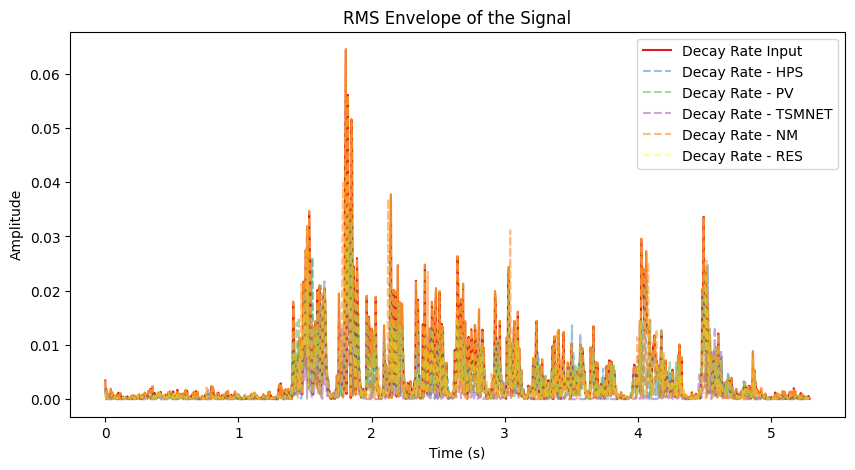

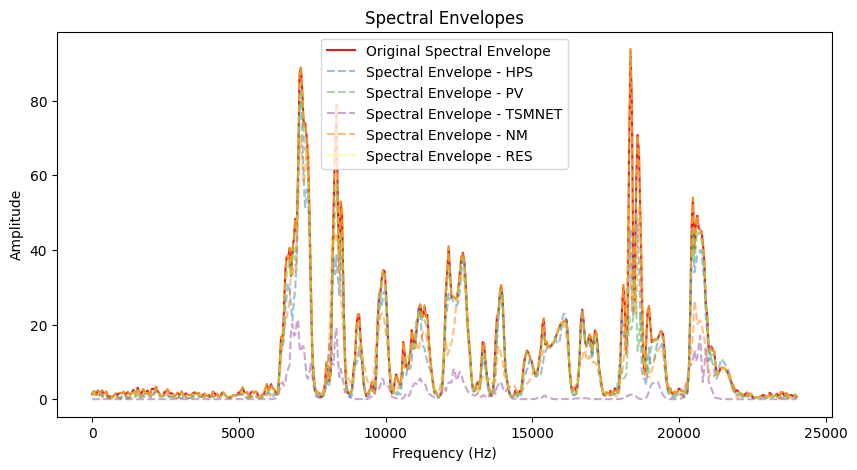

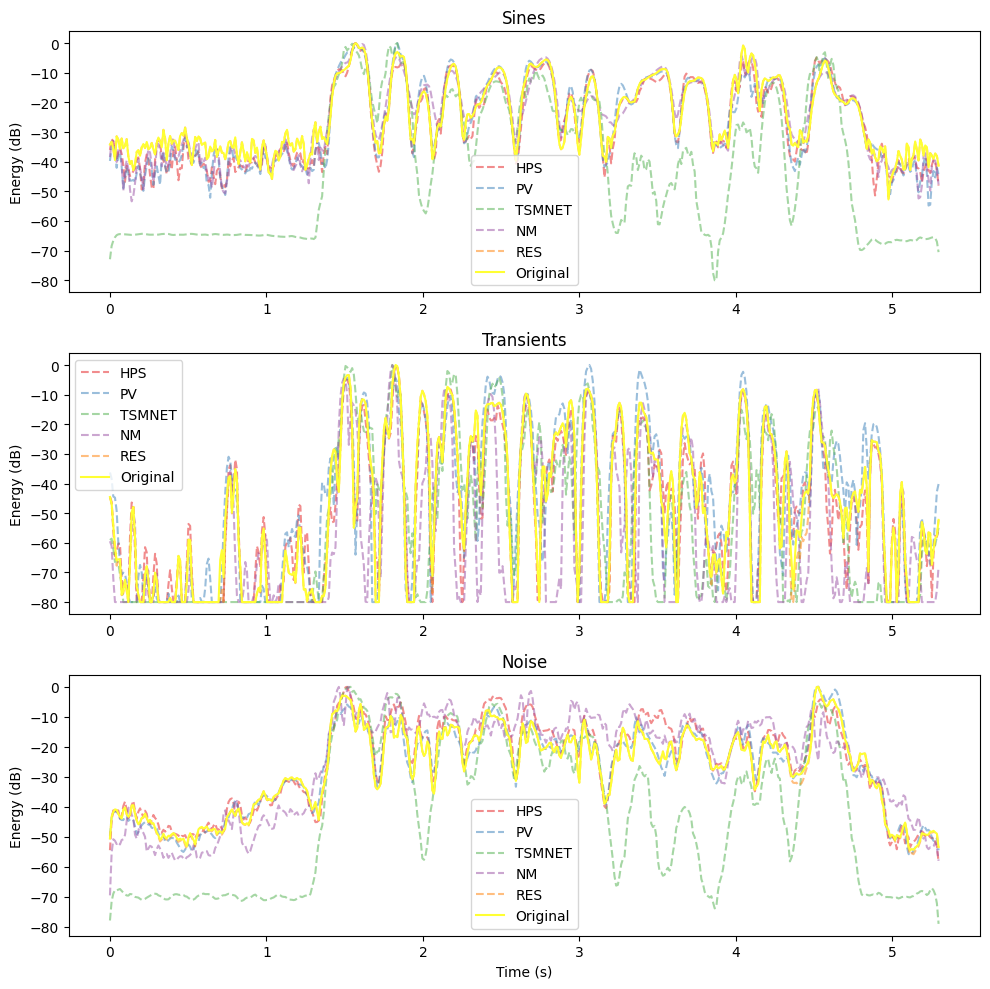

Running metrics for p227_020 with PS algorithm LibrosaPS and factor -12


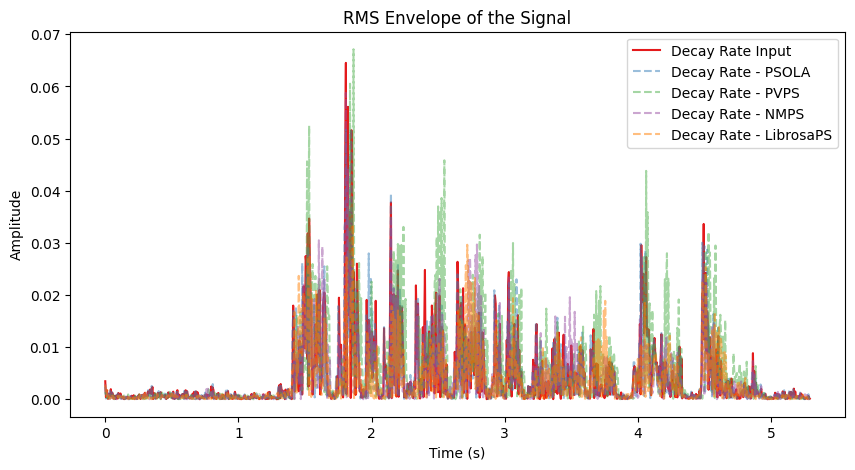

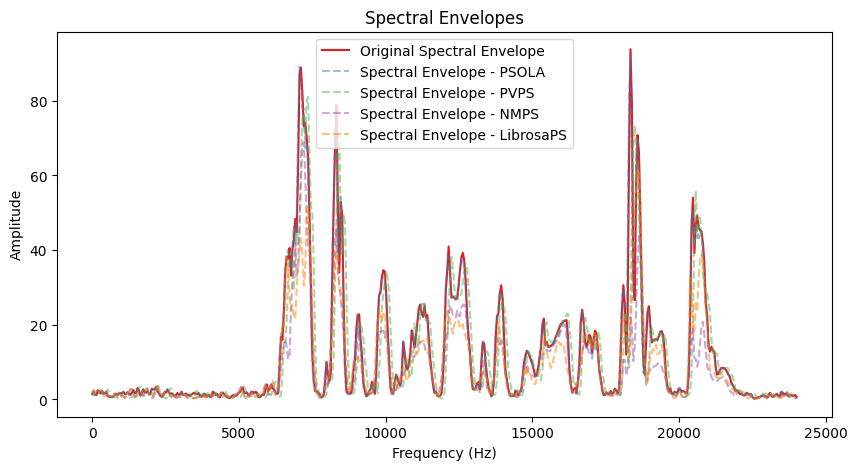

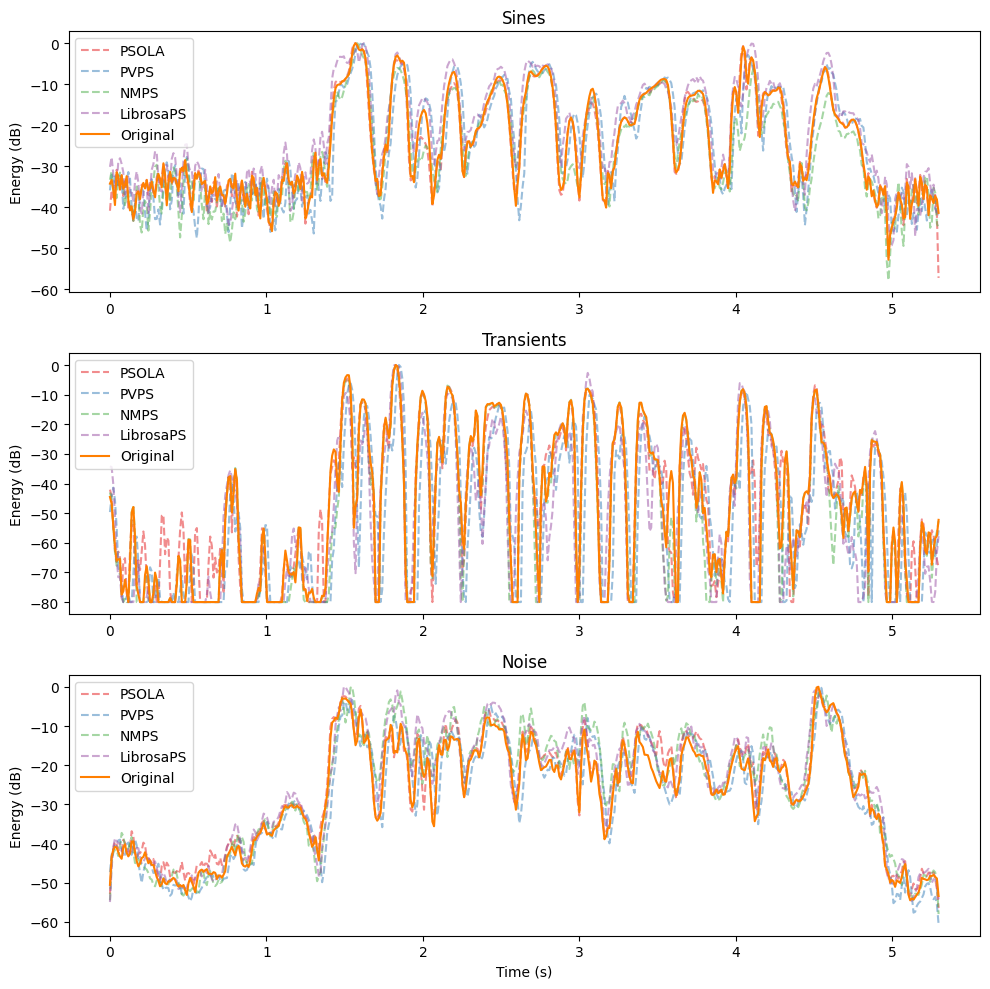

Running metrics for p227_020 with PS algorithm LibrosaPS and factor 7


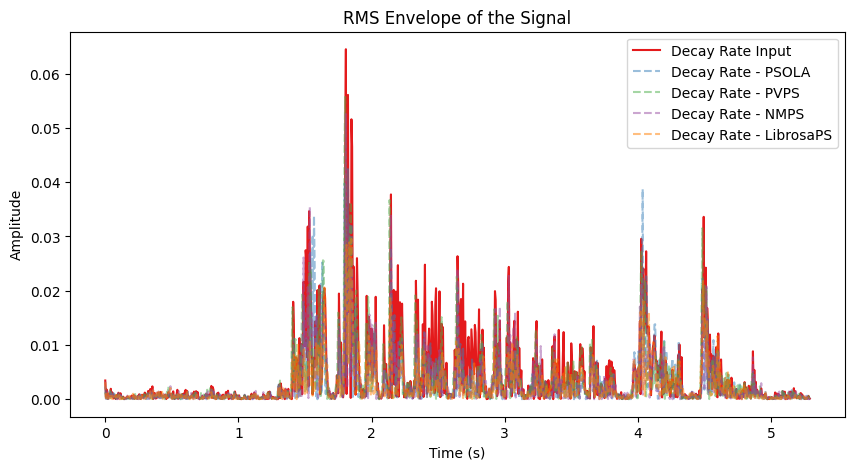

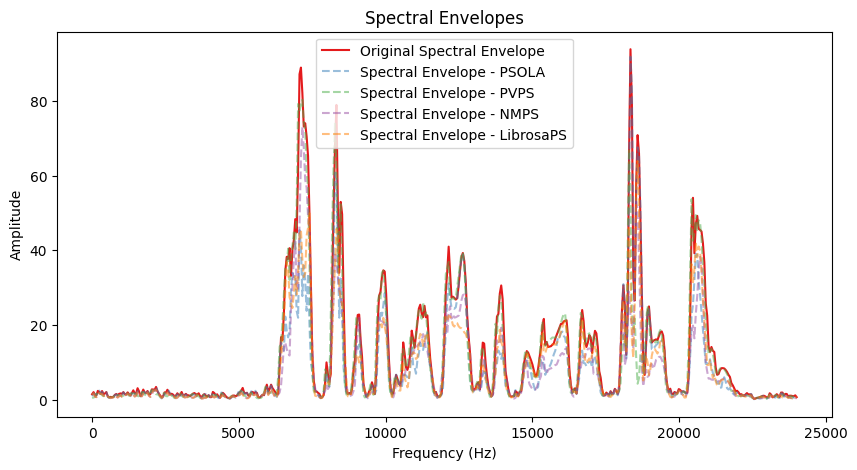

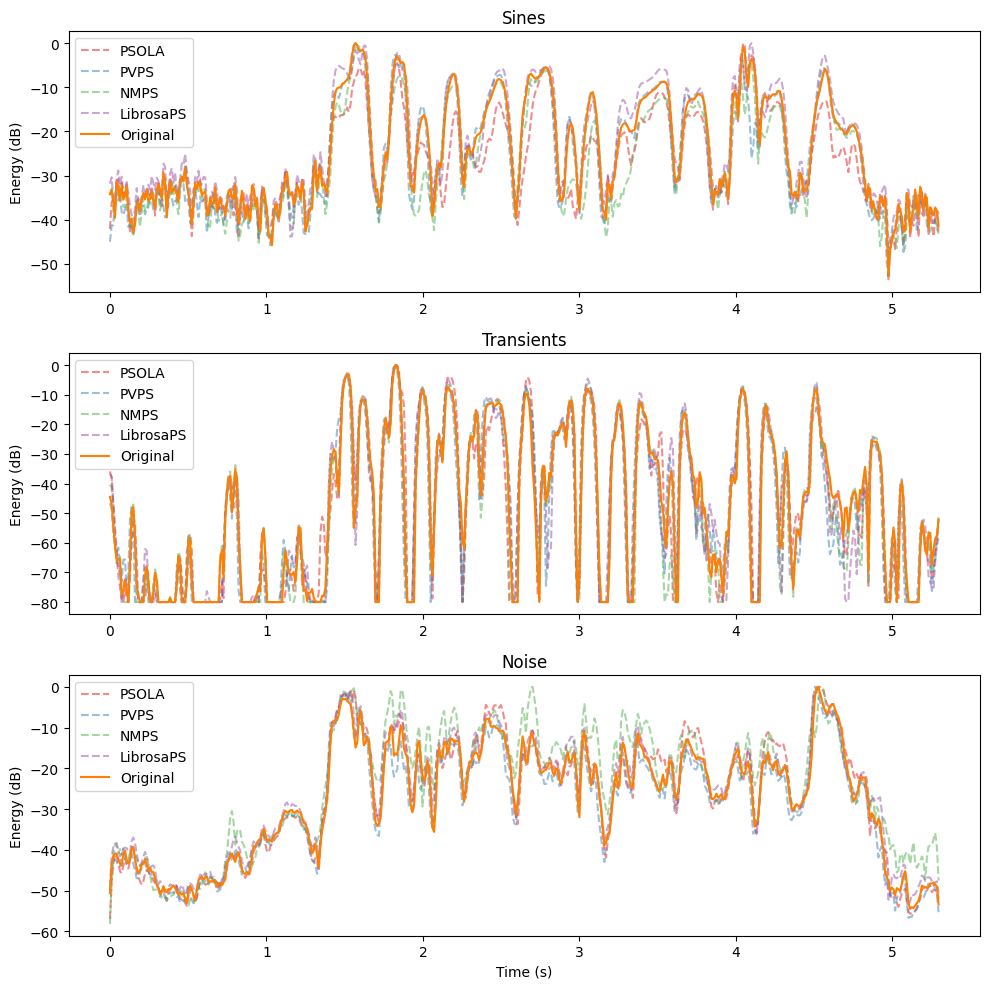

Running metrics for p227_020 with PS algorithm LibrosaPS and factor 12


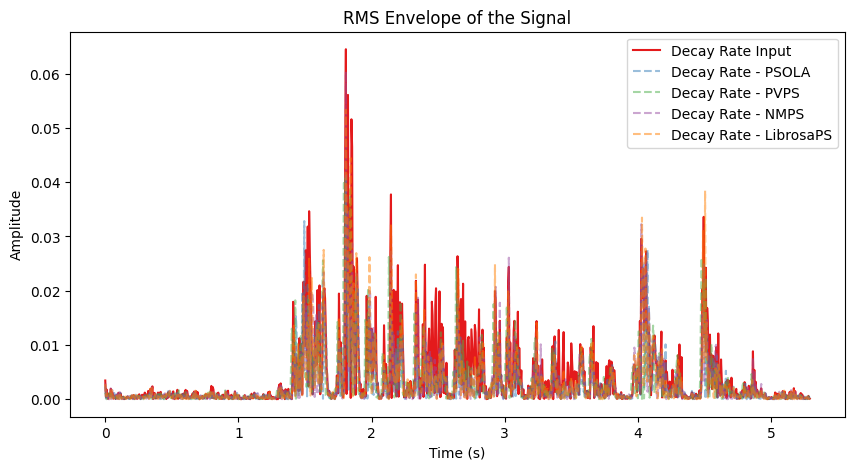

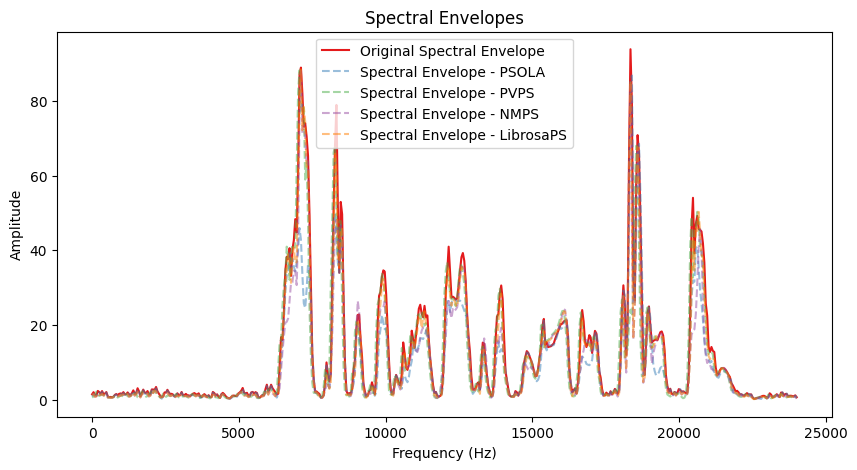

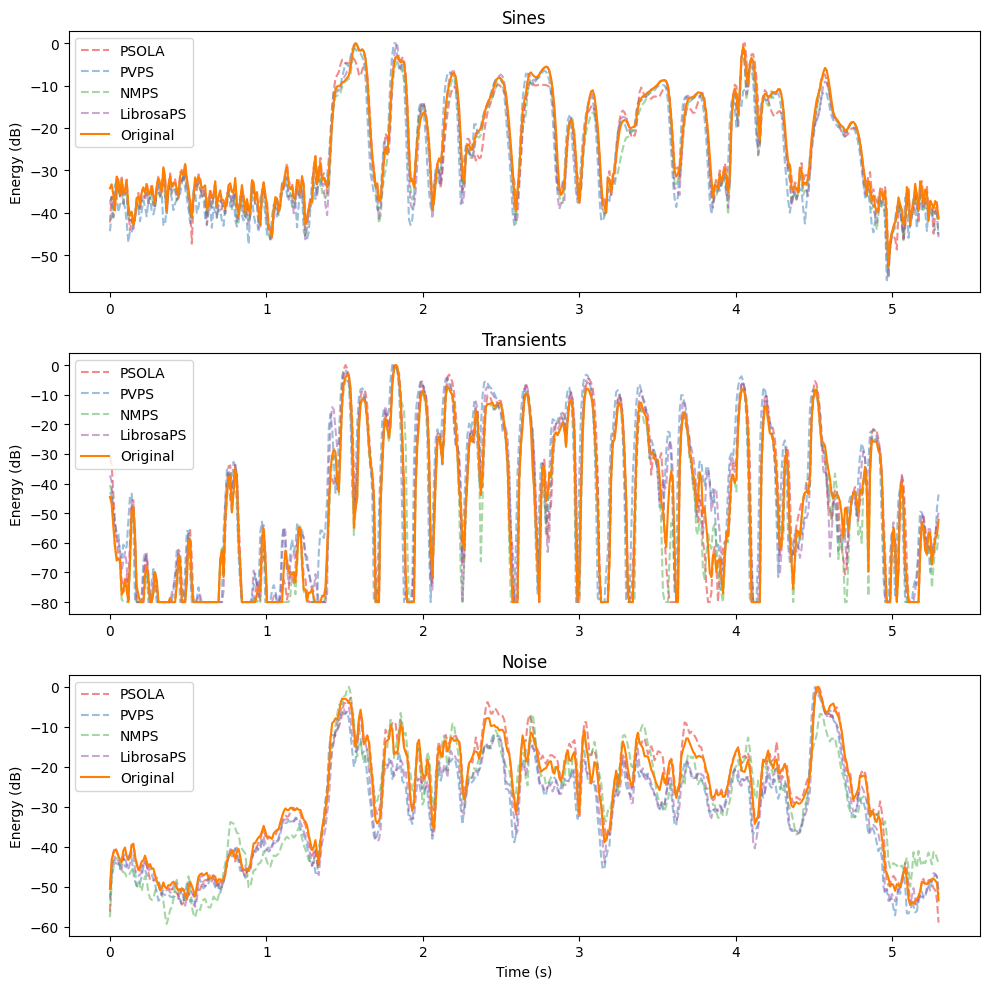

In [ ]:
# run_audio_metrics()

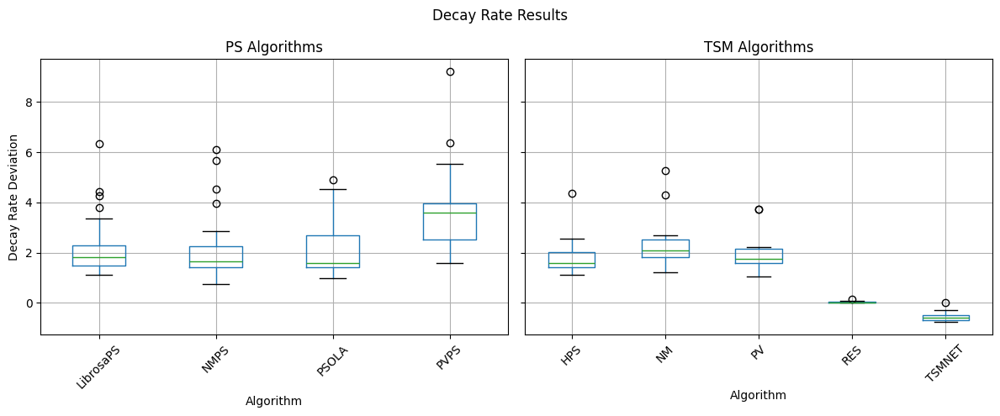

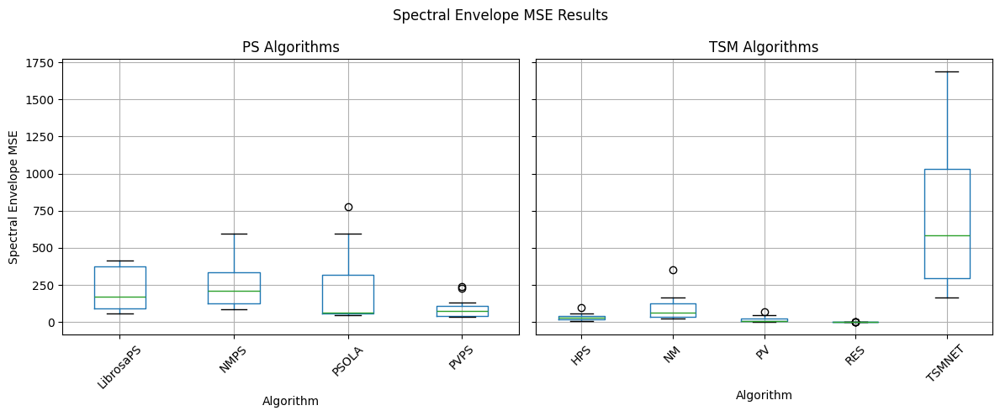

In [8]:
df = pd.read_csv('evaluation/objective/tsmps/metrics.csv')
df_ps = df[df['type'] == 'ps'].reset_index(drop=True)
df_tsm = df[df['type'] == 'tsm'].reset_index(drop=True)

df_ps_dr = df_ps[df_ps['metric'] == 'decay_rate'].reset_index(drop=True)
df_ps_se_mse = df_ps[(df_ps['metric'] == 'se_mse') & (df_ps['factor'].isin(['rt_up', 'rt_down']))].reset_index(drop=True)

df_tsm_dr = df_tsm[df_tsm['metric'] == 'decay_rate'].reset_index(drop=True)
df_tsm_se_mse = df_tsm[df_tsm['metric'] == 'se_mse'].reset_index(drop=True)

fig, axes = plt.subplots(1, 2, figsize=(12, 5), sharey=True)

# Boxplot for df_ps
df_ps_dr.boxplot(by='algo', column='score', rot=45, ax=axes[0])
axes[0].set_title('PS Algorithms')
axes[0].set_xlabel('Algorithm')
axes[0].set_ylabel('Decay Rate Deviation')
# Boxplot for df_tsm
df_tsm_dr.boxplot(by='algo', column='score', rot=45, ax=axes[1])
axes[1].set_title('TSM Algorithms')
axes[1].set_xlabel('Algorithm')

# Set the main title
fig.suptitle("Decay Rate Results")

plt.tight_layout()
plt.show()

fig, axes = plt.subplots(1, 2, figsize=(12, 5), sharey=True)

# Boxplot for df_ps
df_ps_se_mse.boxplot(by='algo', column='score', rot=45, ax=axes[0])
axes[0].set_title('PS Algorithms')
axes[0].set_xlabel('Algorithm')
axes[0].set_ylabel('Spectral Envelope MSE')

# Boxplot for df_tsm
df_tsm_se_mse.boxplot(by='algo', column='score', rot=45, ax=axes[1])
axes[1].set_title('TSM Algorithms')
axes[1].set_xlabel('Algorithm')


# Set the main title
fig.suptitle("Spectral Envelope MSE Results")

plt.tight_layout()
plt.show()

In [9]:

df_avg_std = pd.DataFrame()
algo = df_ps_dr['algo'].unique()
# df_ps_dr = df_ps[df_ps['metric'] == 'decay_rate'].reset_index(drop=True)
# df_ps_se_mse = df_ps[(df_ps['metric'] == 'se_mse') & (df_ps['factor'].isin(['rt_up', 'rt_down']))].reset_index(drop=True)

# df_tsm_dr = df_tsm[df_tsm['metric'] == 'decay_rate'].reset_index(drop=True)
# df_tsm_se_mse = df_tsm[df_tsm['metric'] == 'se_mse'].reset_index(drop=True)
for algo in algo:
    drv_avg = df_ps_dr[df_ps_dr['algo'] == algo]['score'].mean()
    drv_std = df_ps_dr[df_ps_dr['algo'] == algo]['score'].std()
    se_mse_avg = df_ps_se_mse[df_ps_se_mse['algo'] == algo]['score'].mean()
    se_mse_std = df_ps_se_mse[df_ps_se_mse['algo'] == algo]['score'].std()
    
    
    # append to dataframe
    df_avg_std = pd.concat([df_avg_std, pd.DataFrame({
        'algo': [algo],
        'DRV': [drv_avg],
        'DRV STD': [drv_std],
        'SE-MSE': [se_mse_avg],
        'SE-MSE STD': [se_mse_std]
    })], ignore_index=True)
    

# add tsm

for algo in df_tsm_dr['algo'].unique():
    drv_avg = df_tsm_dr[df_tsm_dr['algo'] == algo]['score'].mean()
    drv_std = df_tsm_dr[df_tsm_dr['algo'] == algo]['score'].std()
    se_mse_avg = df_tsm_se_mse[df_tsm_se_mse['algo'] == algo]['score'].mean()
    se_mse_std = df_tsm_se_mse[df_tsm_se_mse['algo'] == algo]['score'].std()

    # append to dataframe
    df_avg_std = pd.concat([df_avg_std, pd.DataFrame({
        'algo': [algo],
        'DRV': [drv_avg],
        'DRV STD': [drv_std],
        'SE-MSE': [se_mse_avg],
        'SE-MSE STD': [se_mse_std]
    })], ignore_index=True)
    
df_avg_std.to_csv("evaluation/objective/tsmps/metrics_avg_std.csv", index=False)
